In [2]:
from __future__ import division
from __future__ import print_function

import matplotlib.pyplot as plt
import numpy as np
import ehtim as eh
from ehtim.calibrating import self_cal as sc

Welcome to eht-imaging! v  1.1.1


In [1]:
from pynfft.nfft import NFFT

Loading text image:  eht-imaging/models/avery_sgra_eofn.txt


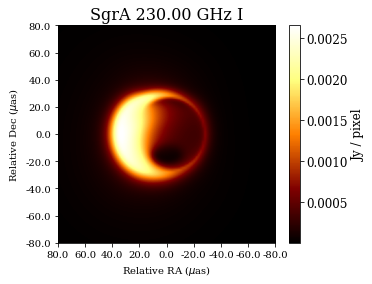

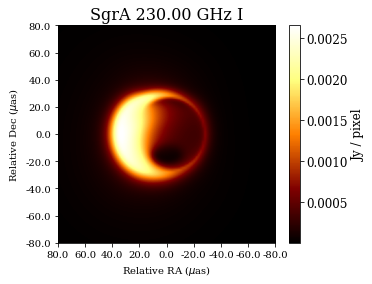

In [11]:
# Load the image and the array
im = eh.image.load_txt('eht-imaging/models/avery_sgra_eofn.txt')
eht = eh.array.load_txt('eht-imaging/arrays/EHT2017.txt')

# Look at the image
im.display()

Generating empty observation file . . . 
Producing clean visibilities from image with nfft FT . . . 
Adding gain + phase errors to data and applying a priori calibration . . . 
   Applying atmospheric phase corruption: phasecal-->False
Adding thermal noise to data . . . 


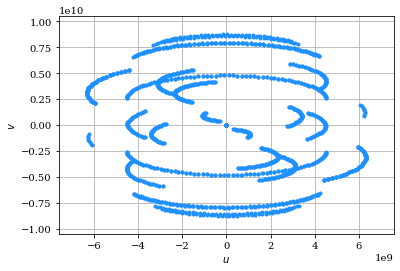

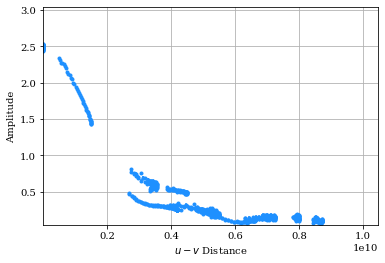

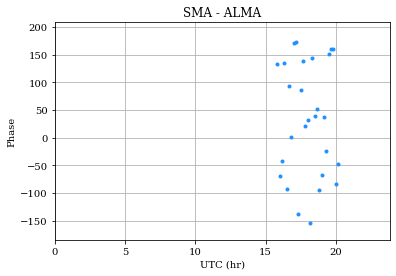

In [23]:
# Observe the image
# tint_sec is the integration time in seconds, and tadv_sec is the advance time between scans
# tstart_hr is the GMST time of the start of the observation and tstop_hr is the GMST time of the end
# bw_hz is the  bandwidth in Hz
# sgrscat=True blurs the visibilities with the Sgr A* scattering kernel for the appropriate image frequency
# ampcal and phasecal determine if gain variations and phase errors are included
tint_sec = 5
tadv_sec = 600
tstart_hr = 0
tstop_hr = 24
bw_hz = 4e9
######
# im_new = im.copy()
# print(im_new.ra)
# print(im_new.dec)
# im_new.ra = 12.0
# im_new.dec = 12.0

obs = im.observe(eht, tint_sec, tadv_sec, tstart_hr, tstop_hr, bw_hz,
                 sgrscat=False, ampcal=True, phasecal=False)

# You can deblur the visibilities by dividing by the scattering kernel if necessary
#obs = obs.deblur()

# These are some simple plots you can check
obs.plotall('u','v', conj=True) # uv coverage
obs.plotall('uvdist','amp') # amplitude with baseline distance'
obs.plot_bl('SMA','ALMA','phase') # visibility phase on a baseline over time

In [19]:
obs.data['vis']

array([-0.72397631-2.34735395j, -0.05685698+0.13653011j,
       -0.12143495+0.13534628j, ...,  1.98676908-1.50782571j,
       -0.11348206-0.01755211j, -0.15305806+0.05408723j])

In [21]:
obs.data['u']

array([ 6.74976576e+04,  3.90651510e+09, -3.90644760e+09, ...,
        7.01530523e+04,  3.84025474e+09, -3.84018459e+09])

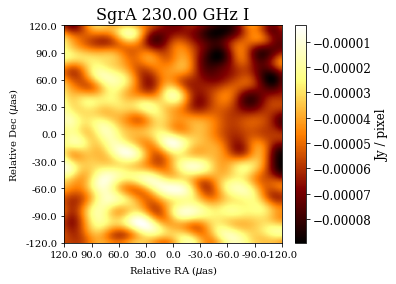

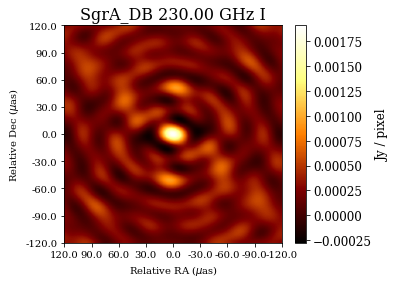

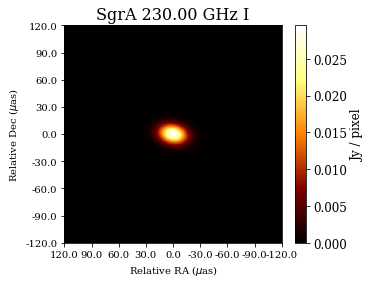

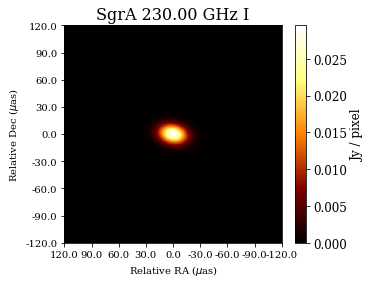

In [13]:
# You can check out the dirty image, dirty beam, and clean beam
npix = 64
fov = 1.5*im.xdim * im.psize # slightly enlarge the field of view
dim = obs.dirtyimage(npix, fov)
dbeam = obs.dirtybeam(npix, fov)
cbeam = obs.cleanbeam(npix,fov)
dim.display()
dbeam.display()
cbeam.display()

In [7]:
# Resolution
beamparams = obs.fit_beam() # fitted beam parameters (fwhm_maj, fwhm_min, theta) in radians
res = obs.res() # nominal array resolution, 1/longest baseline
print("Clean beam parameters: " , beamparams)
print("Nominal Resolution: " ,res)

Clean beam parameters:  [4.37456699e-10 1.58782582e-10 3.08082307e+00]
Nominal Resolution:  2.226422912921051e-10


Generating I image...
Getting bispectra:: type vis, count min, scan 44/44 Initial S_1: 0.000000 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 1227.919562 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 122691.956241
Total Data 1:  95
Total Pixel #:  1024
Clipped Pixel #:  1024

i: 0 chi2_1: 1227.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.00 s_2: 0.00 s_3: 0.00


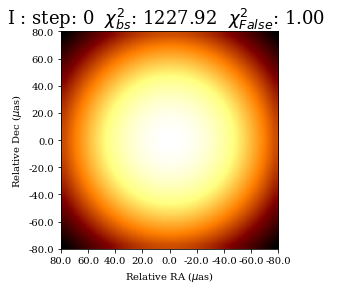

i: 1 chi2_1: 343.75 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.54 s_2: 0.00 s_3: 0.00


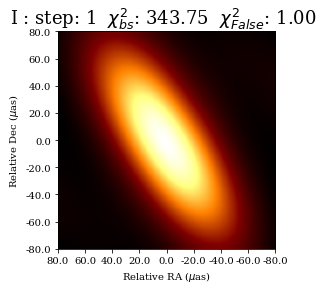

i: 2 chi2_1: 337.29 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.37 s_2: 0.00 s_3: 0.00


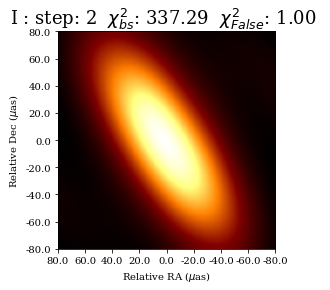

i: 3 chi2_1: 325.50 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.40 s_2: 0.00 s_3: 0.00


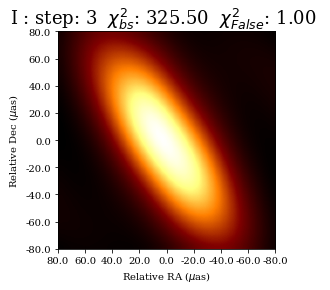

i: 4 chi2_1: 301.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.42 s_2: 0.00 s_3: 0.00


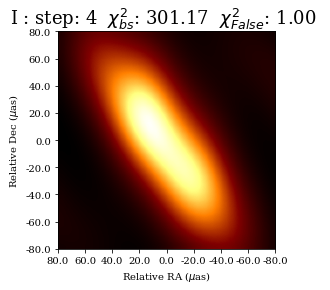

i: 5 chi2_1: 277.40 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.37 s_2: 0.00 s_3: 0.00


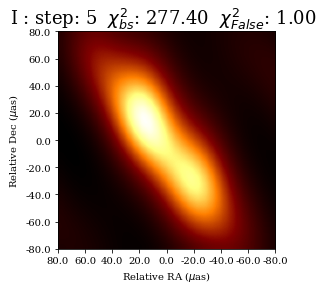

i: 6 chi2_1: 216.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.40 s_2: 0.00 s_3: 0.00


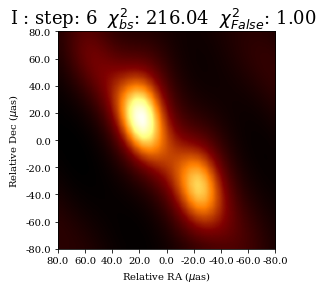

i: 7 chi2_1: 188.48 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.45 s_2: 0.00 s_3: 0.00


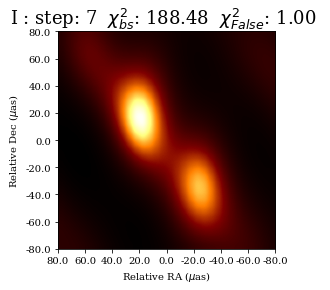

i: 8 chi2_1: 120.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.27 s_2: 0.00 s_3: 0.00


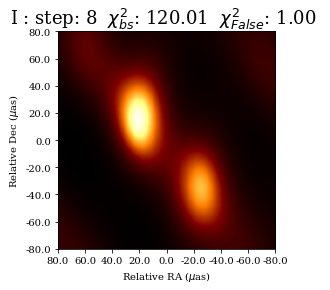

i: 9 chi2_1: 113.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.27 s_2: 0.00 s_3: 0.00


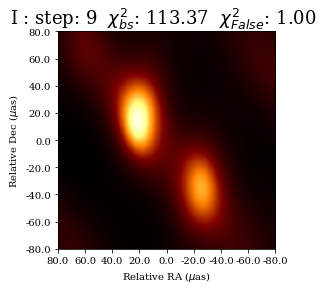

i: 10 chi2_1: 84.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.30 s_2: 0.00 s_3: 0.00


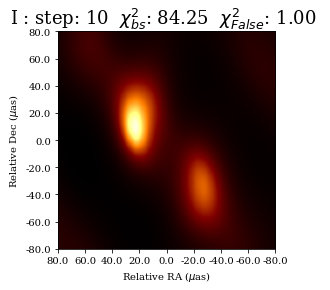

i: 11 chi2_1: 60.64 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.41 s_2: 0.00 s_3: 0.00


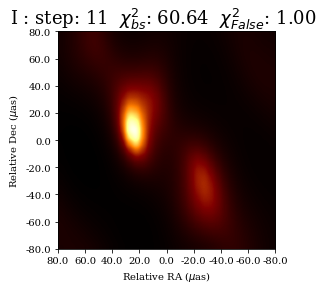

i: 12 chi2_1: 36.31 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.64 s_2: 0.00 s_3: 0.00


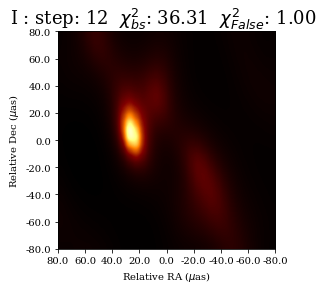

i: 13 chi2_1: 31.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.53 s_2: 0.00 s_3: 0.00


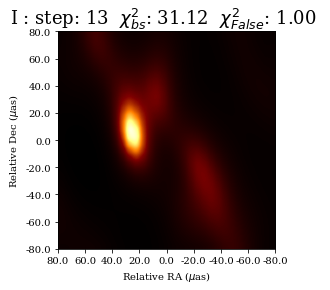

i: 14 chi2_1: 29.22 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.52 s_2: 0.00 s_3: 0.00


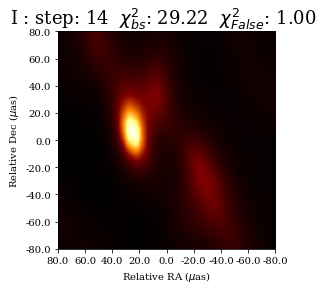

i: 15 chi2_1: 26.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.53 s_2: 0.00 s_3: 0.00


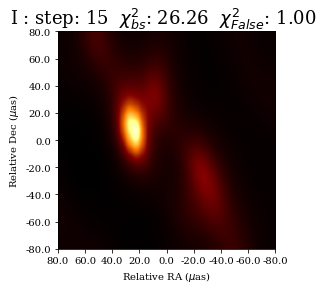

i: 16 chi2_1: 24.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.54 s_2: 0.00 s_3: 0.00


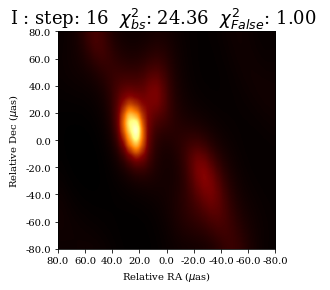

i: 17 chi2_1: 18.96 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.57 s_2: 0.00 s_3: 0.00


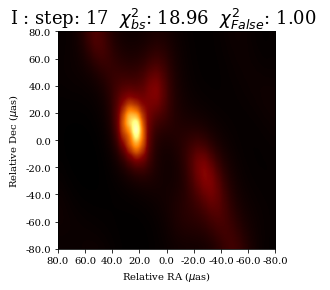

i: 18 chi2_1: 14.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.55 s_2: 0.00 s_3: 0.00


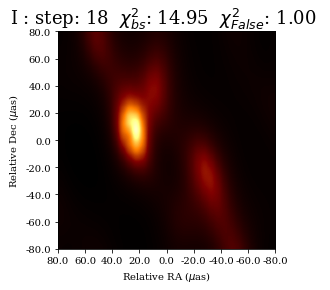

i: 19 chi2_1: 14.32 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.59 s_2: 0.00 s_3: 0.00


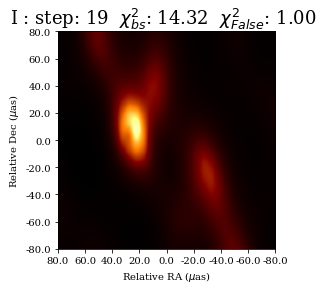

i: 20 chi2_1: 13.60 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.57 s_2: 0.00 s_3: 0.00


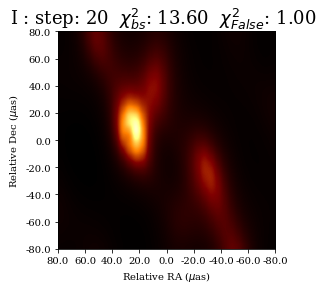

i: 21 chi2_1: 13.40 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.57 s_2: 0.00 s_3: 0.00


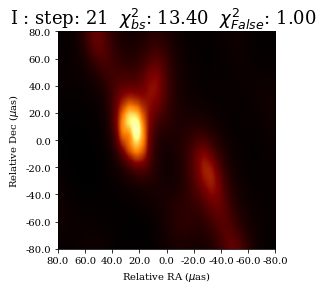

i: 22 chi2_1: 12.43 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.59 s_2: 0.00 s_3: 0.00


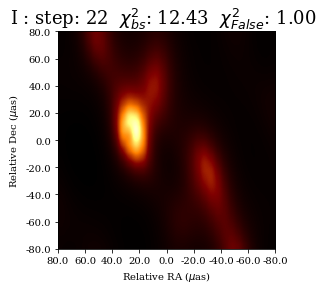

i: 23 chi2_1: 11.30 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.60 s_2: 0.00 s_3: 0.00


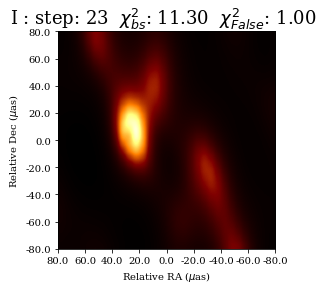

i: 24 chi2_1: 10.40 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.60 s_2: 0.00 s_3: 0.00


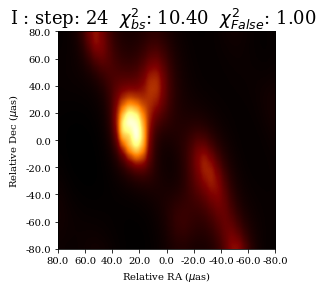

i: 25 chi2_1: 9.47 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.58 s_2: 0.00 s_3: 0.00


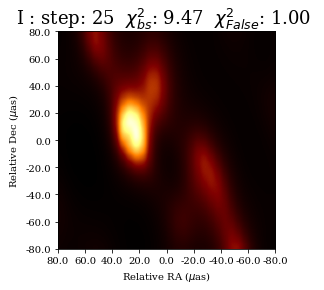

i: 26 chi2_1: 8.21 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.58 s_2: 0.00 s_3: 0.00


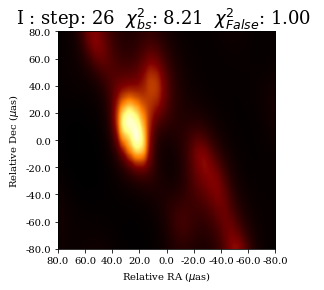

i: 27 chi2_1: 7.23 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.59 s_2: 0.00 s_3: 0.00


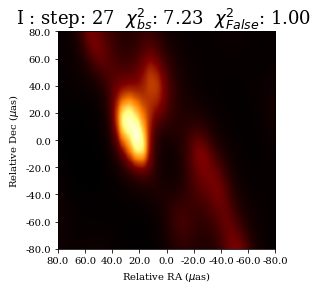

i: 28 chi2_1: 6.59 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.65 s_2: 0.00 s_3: 0.00


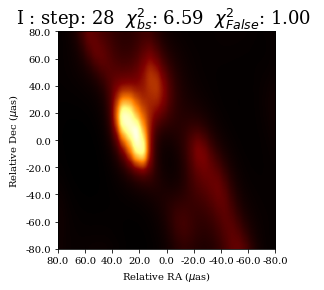

i: 29 chi2_1: 5.85 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.61 s_2: 0.00 s_3: 0.00


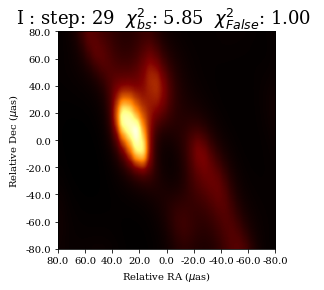

i: 30 chi2_1: 5.45 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.64 s_2: 0.00 s_3: 0.00


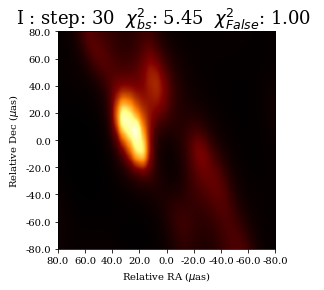

i: 31 chi2_1: 5.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.69 s_2: 0.00 s_3: 0.00


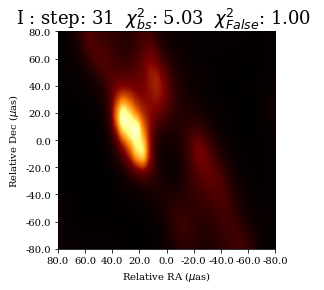

i: 32 chi2_1: 4.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.69 s_2: 0.00 s_3: 0.00


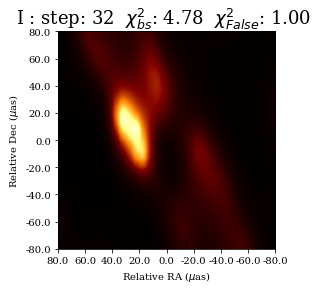

i: 33 chi2_1: 4.47 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.70 s_2: 0.00 s_3: 0.00


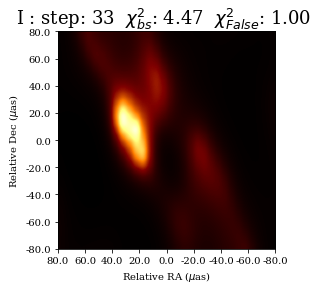

i: 34 chi2_1: 3.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.74 s_2: 0.00 s_3: 0.00


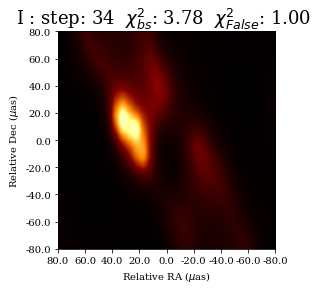

i: 35 chi2_1: 3.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.73 s_2: 0.00 s_3: 0.00


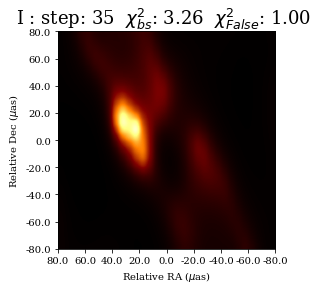

i: 36 chi2_1: 3.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.76 s_2: 0.00 s_3: 0.00


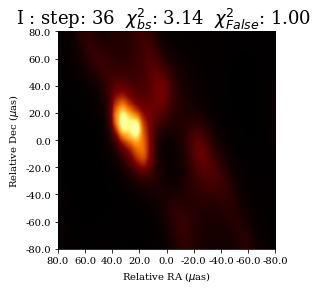

i: 37 chi2_1: 2.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.76 s_2: 0.00 s_3: 0.00


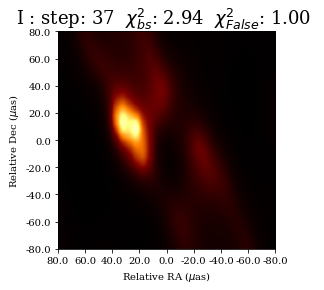

i: 38 chi2_1: 2.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.77 s_2: 0.00 s_3: 0.00


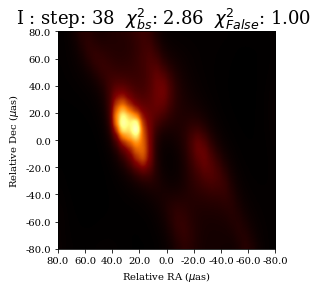

i: 39 chi2_1: 2.70 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.79 s_2: 0.00 s_3: 0.00


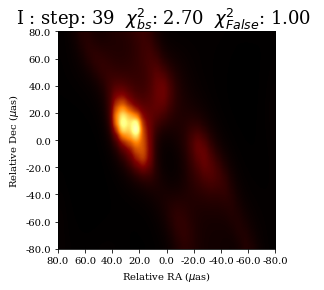

i: 40 chi2_1: 2.49 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.81 s_2: 0.00 s_3: 0.00


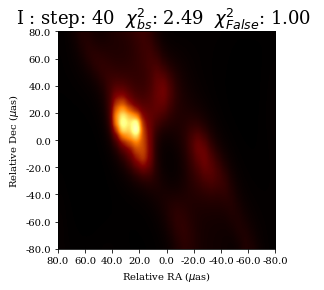

i: 41 chi2_1: 2.32 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.84 s_2: 0.00 s_3: 0.00


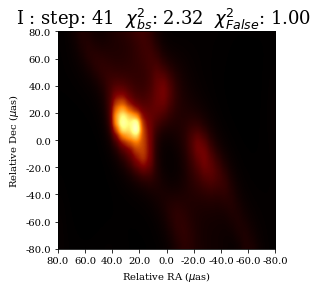

i: 42 chi2_1: 2.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.85 s_2: 0.00 s_3: 0.00


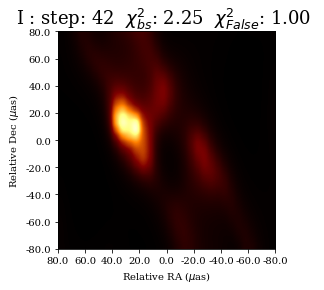

i: 43 chi2_1: 2.18 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.89 s_2: 0.00 s_3: 0.00


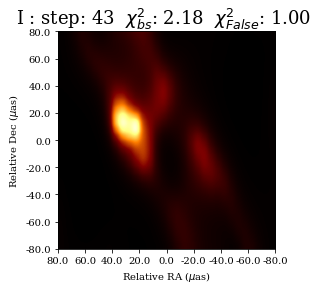

i: 44 chi2_1: 2.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.90 s_2: 0.00 s_3: 0.00


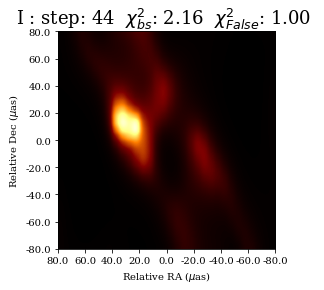

i: 45 chi2_1: 2.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.92 s_2: 0.00 s_3: 0.00


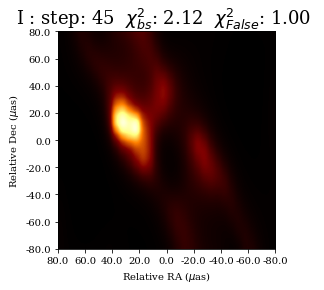

i: 46 chi2_1: 2.09 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.94 s_2: 0.00 s_3: 0.00


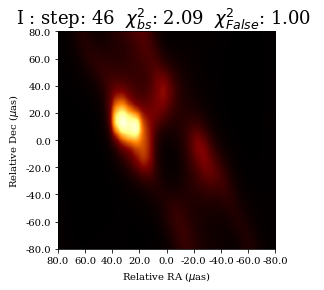

i: 47 chi2_1: 2.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.95 s_2: 0.00 s_3: 0.00


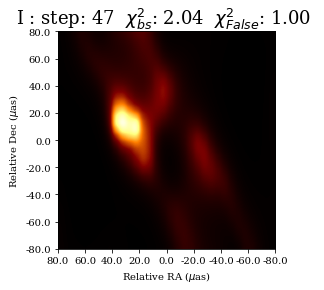

i: 48 chi2_1: 1.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.99 s_2: 0.00 s_3: 0.00


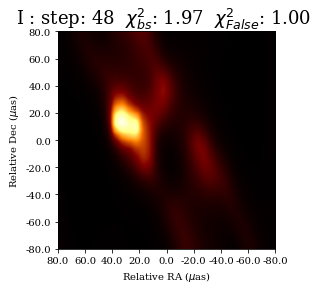

i: 49 chi2_1: 1.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.97 s_2: 0.00 s_3: 0.00


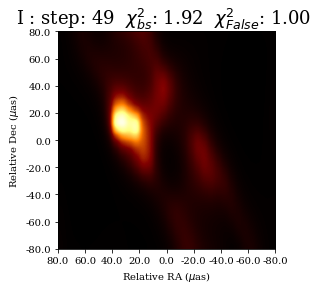

i: 50 chi2_1: 1.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.99 s_2: 0.00 s_3: 0.00


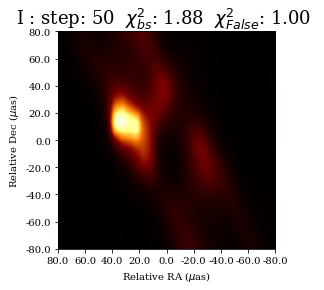

i: 51 chi2_1: 1.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.99 s_2: 0.00 s_3: 0.00


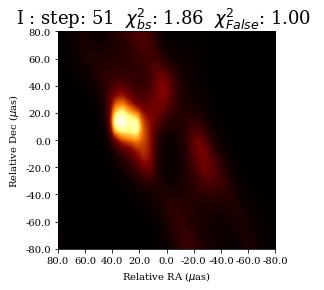

i: 52 chi2_1: 1.83 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.00 s_2: 0.00 s_3: 0.00


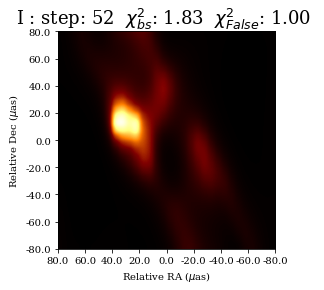

i: 53 chi2_1: 1.74 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.03 s_2: 0.00 s_3: 0.00


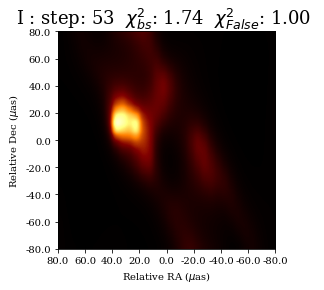

i: 54 chi2_1: 1.67 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.02 s_2: 0.00 s_3: 0.00


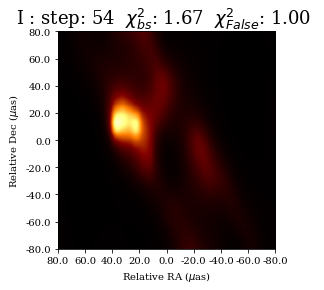

i: 55 chi2_1: 1.64 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.03 s_2: 0.00 s_3: 0.00


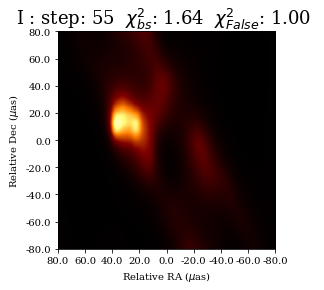

i: 56 chi2_1: 1.60 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.02 s_2: 0.00 s_3: 0.00


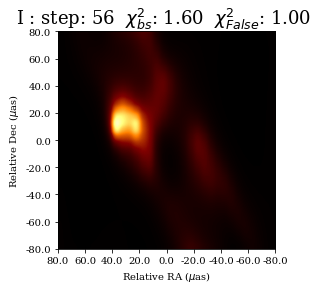

i: 57 chi2_1: 1.58 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.00 s_2: 0.00 s_3: 0.00


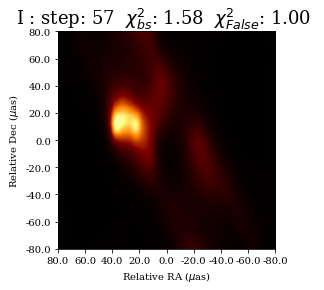

i: 58 chi2_1: 1.56 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.00 s_2: 0.00 s_3: 0.00


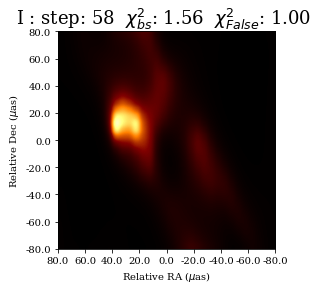

i: 59 chi2_1: 1.55 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.00 s_2: 0.00 s_3: 0.00


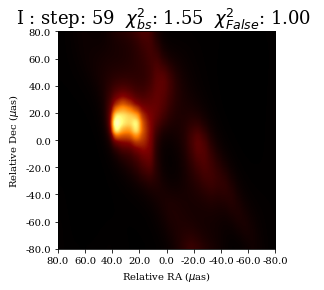

i: 60 chi2_1: 1.49 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.02 s_2: 0.00 s_3: 0.00


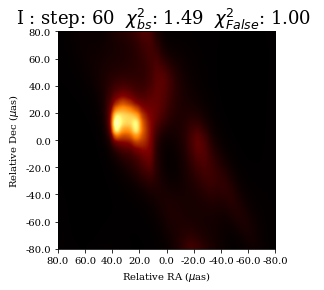

i: 61 chi2_1: 1.43 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.03 s_2: 0.00 s_3: 0.00


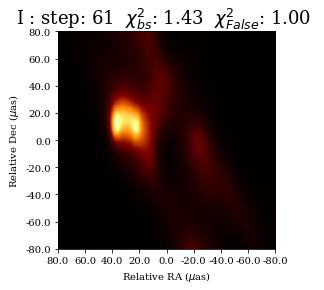

i: 62 chi2_1: 1.41 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


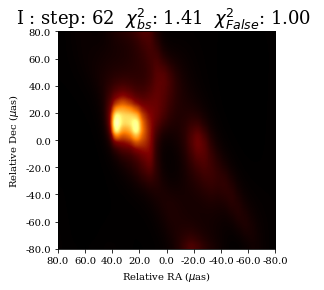

i: 63 chi2_1: 1.40 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


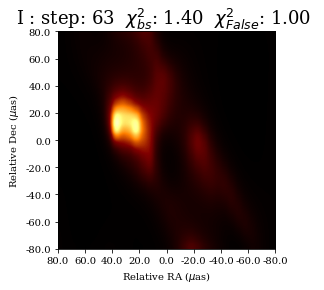

i: 64 chi2_1: 1.40 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


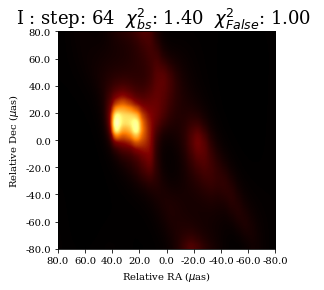

i: 65 chi2_1: 1.39 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.06 s_2: 0.00 s_3: 0.00


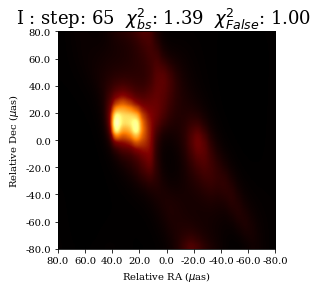

i: 66 chi2_1: 1.39 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.06 s_2: 0.00 s_3: 0.00


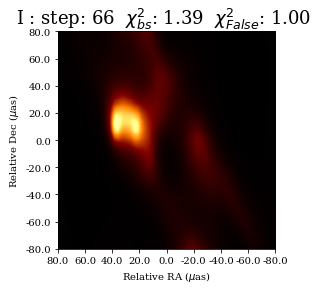

i: 67 chi2_1: 1.38 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.07 s_2: 0.00 s_3: 0.00


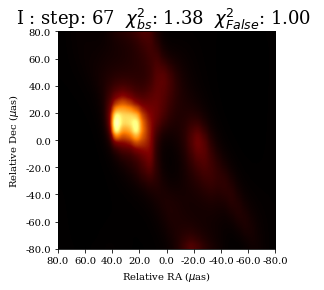

i: 68 chi2_1: 1.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


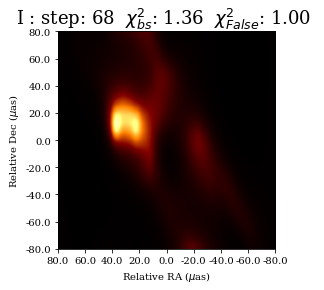

i: 69 chi2_1: 1.33 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.09 s_2: 0.00 s_3: 0.00


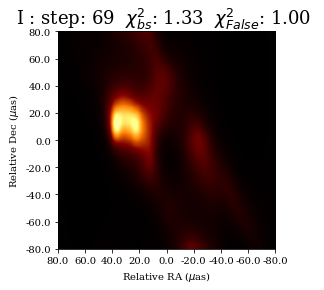

i: 70 chi2_1: 1.30 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


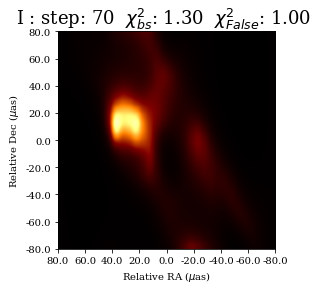

i: 71 chi2_1: 1.27 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.11 s_2: 0.00 s_3: 0.00


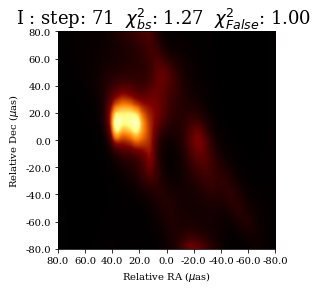

i: 72 chi2_1: 1.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


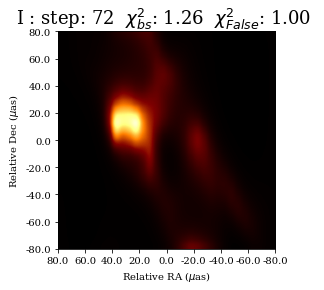

i: 73 chi2_1: 1.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.11 s_2: 0.00 s_3: 0.00


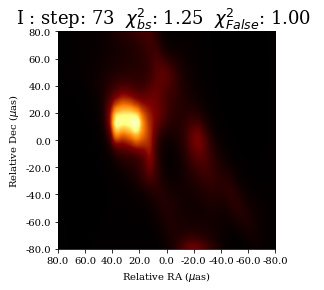

i: 74 chi2_1: 1.24 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.12 s_2: 0.00 s_3: 0.00


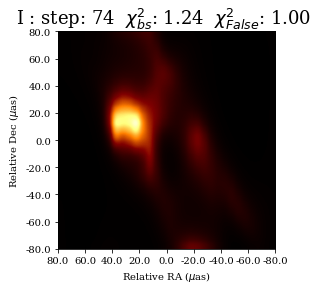

i: 75 chi2_1: 1.22 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.12 s_2: 0.00 s_3: 0.00


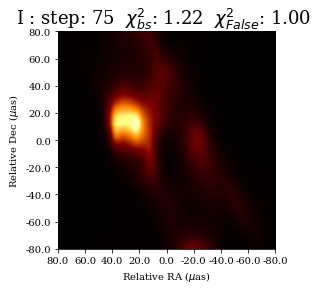

i: 76 chi2_1: 1.20 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.11 s_2: 0.00 s_3: 0.00


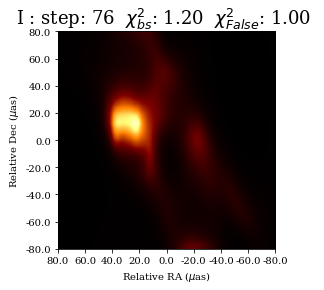

i: 77 chi2_1: 1.18 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


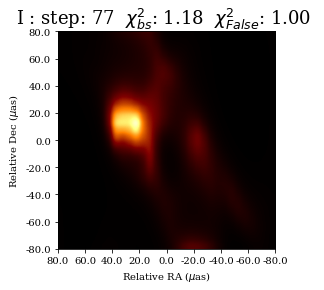

i: 78 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


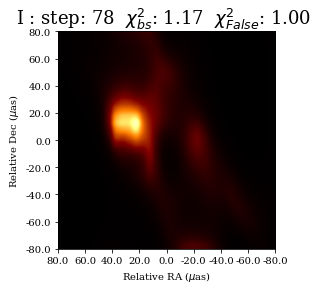

i: 79 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


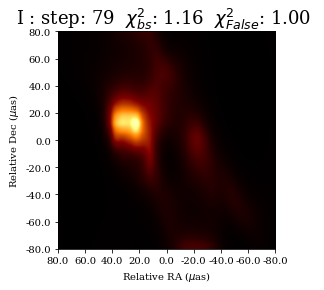

i: 80 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


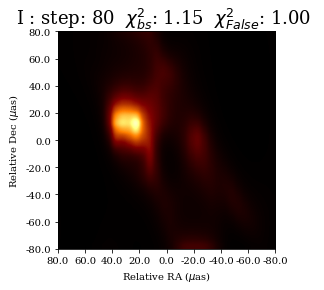

i: 81 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


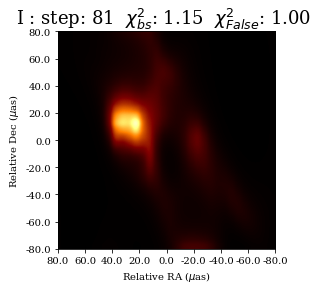

i: 82 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


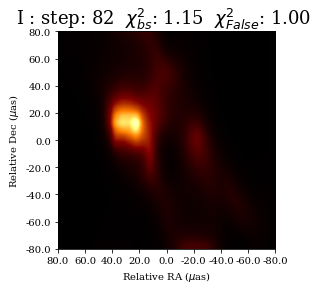

i: 83 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


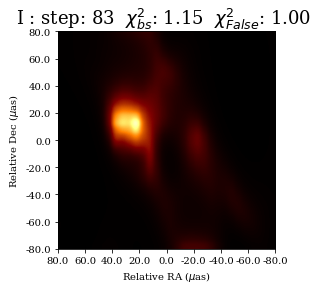

i: 84 chi2_1: 1.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


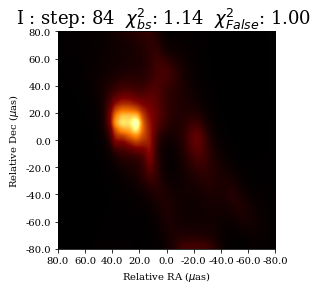

i: 85 chi2_1: 1.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.07 s_2: 0.00 s_3: 0.00


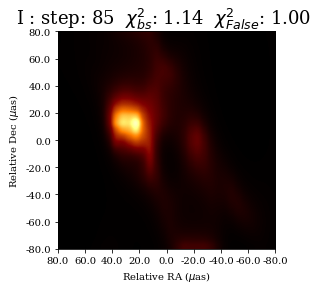

i: 86 chi2_1: 1.13 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.07 s_2: 0.00 s_3: 0.00


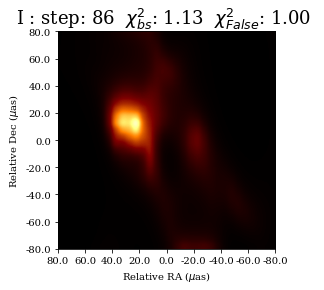

i: 87 chi2_1: 1.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.06 s_2: 0.00 s_3: 0.00


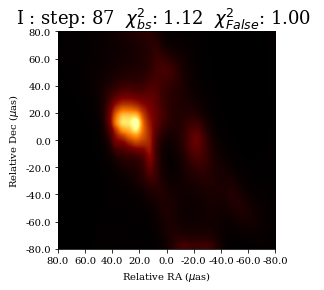

i: 88 chi2_1: 1.11 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.06 s_2: 0.00 s_3: 0.00


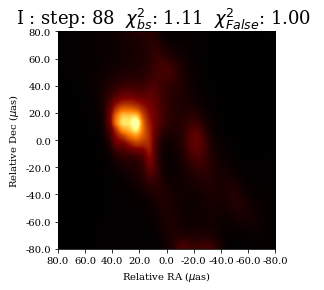

i: 89 chi2_1: 1.11 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


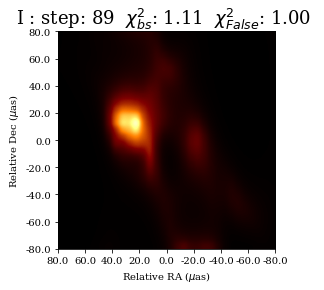

i: 90 chi2_1: 1.10 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


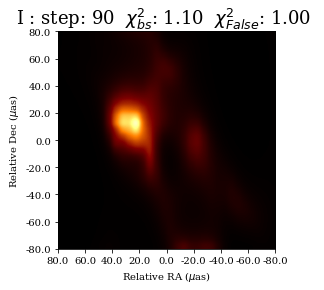

i: 91 chi2_1: 1.10 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


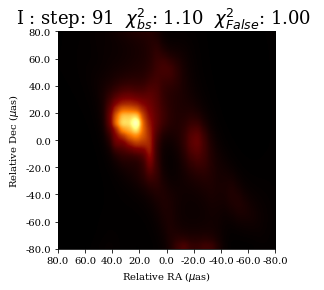

i: 92 chi2_1: 1.10 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


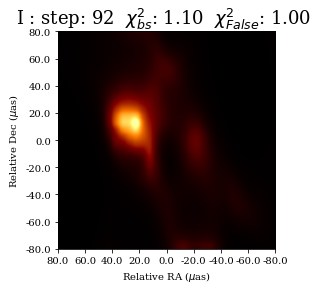

i: 93 chi2_1: 1.09 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.05 s_2: 0.00 s_3: 0.00


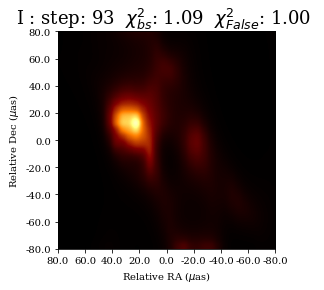

i: 94 chi2_1: 1.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.06 s_2: 0.00 s_3: 0.00


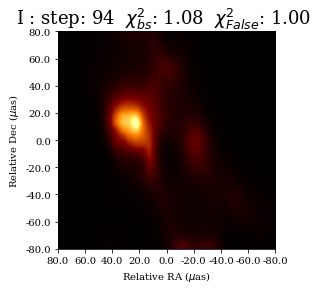

i: 95 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.08 s_2: 0.00 s_3: 0.00


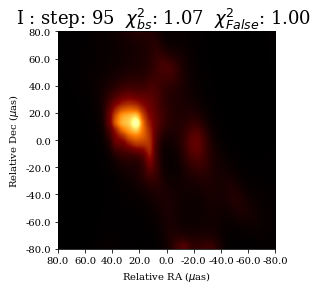

i: 96 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


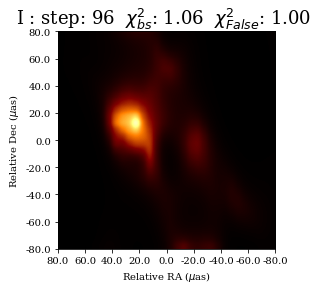

i: 97 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.11 s_2: 0.00 s_3: 0.00


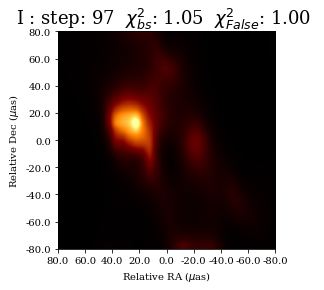

i: 98 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.11 s_2: 0.00 s_3: 0.00


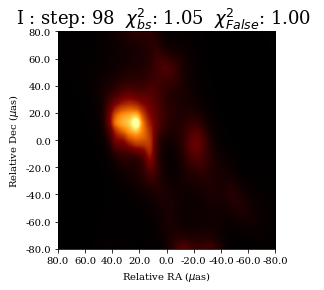

i: 99 chi2_1: 1.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00


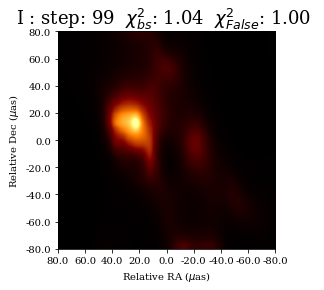

i: 100 chi2_1: 1.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 2.10 s_2: 0.00 s_3: 0.00
time: 28.835904 s
J: 6.528422
Final Chi^2_1: 1.044250 Chi^2_2: 1.000000  Chi^2_3: 1.000000
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
Generating I image...
Getting bispectra:: type vis, count min, scan 44/44 Initial S_1: 0.462756 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 570.868355 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 28493.880801
Total Data 1:  95
Total Pixel #:  1024
Clipped Pixel #:  1024



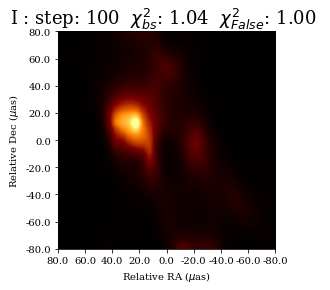

i: 0 chi2_1: 570.87 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.46 s_2: 0.00 s_3: 0.00


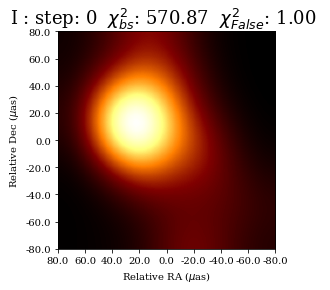

i: 1 chi2_1: 310.87 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.58 s_2: 0.00 s_3: 0.00


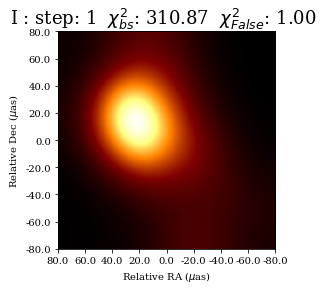

i: 2 chi2_1: 233.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.66 s_2: 0.00 s_3: 0.00


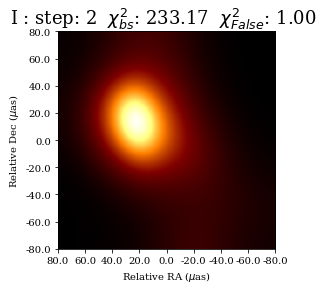

i: 3 chi2_1: 206.91 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.78 s_2: 0.00 s_3: 0.00


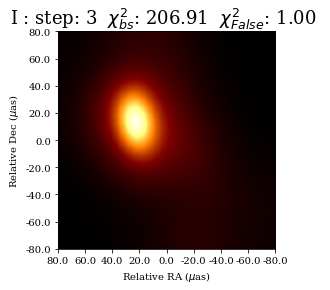

i: 4 chi2_1: 142.56 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.79 s_2: 0.00 s_3: 0.00


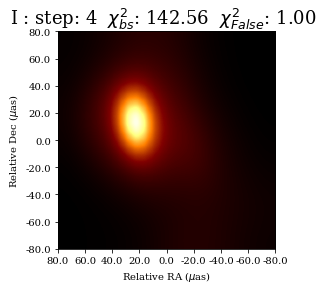

i: 5 chi2_1: 94.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.86 s_2: 0.00 s_3: 0.00


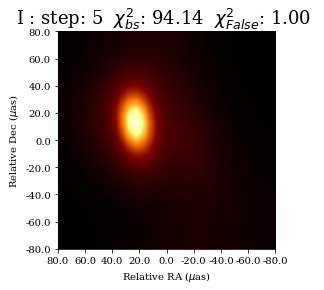

i: 6 chi2_1: 38.56 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.88 s_2: 0.00 s_3: 0.00


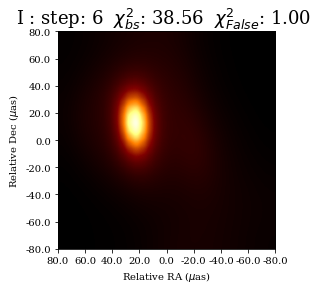

i: 7 chi2_1: 31.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.89 s_2: 0.00 s_3: 0.00


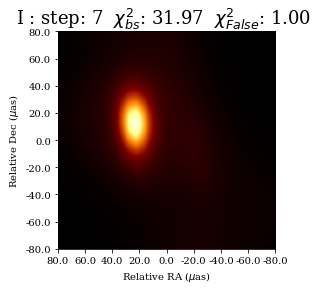

i: 8 chi2_1: 24.84 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.90 s_2: 0.00 s_3: 0.00


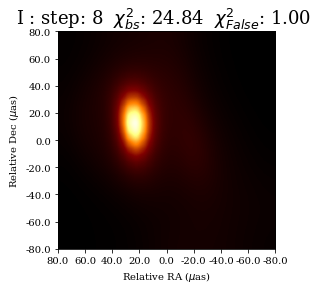

i: 9 chi2_1: 18.30 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.93 s_2: 0.00 s_3: 0.00


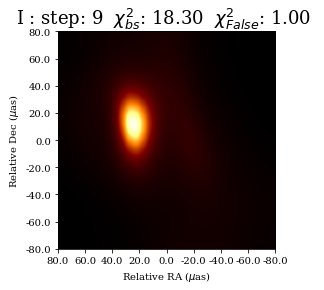

i: 10 chi2_1: 13.90 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


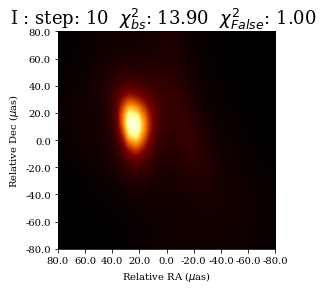

i: 11 chi2_1: 12.50 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


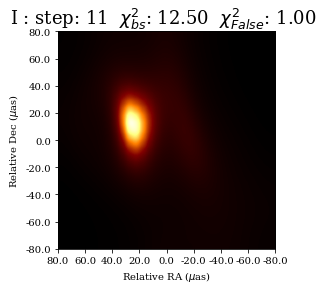

i: 12 chi2_1: 11.70 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


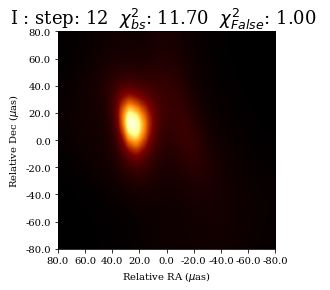

i: 13 chi2_1: 11.34 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


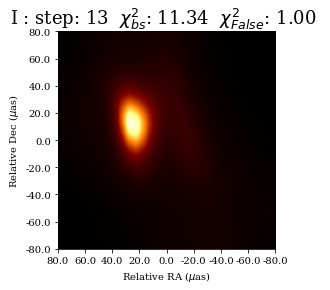

i: 14 chi2_1: 10.23 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


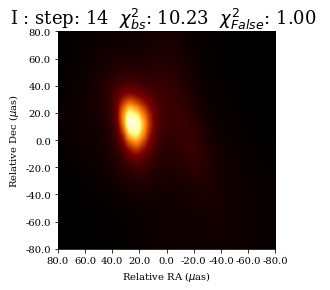

i: 15 chi2_1: 8.55 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


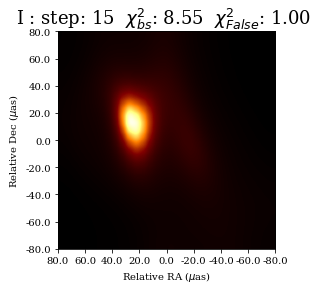

i: 16 chi2_1: 6.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


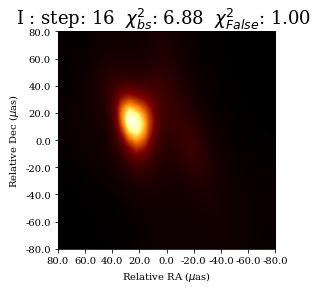

i: 17 chi2_1: 5.82 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


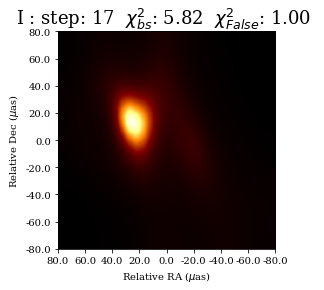

i: 18 chi2_1: 5.49 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


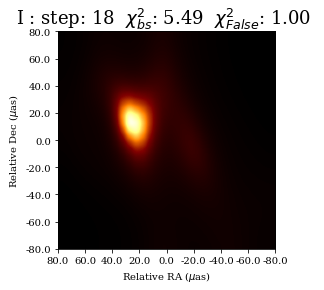

i: 19 chi2_1: 5.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


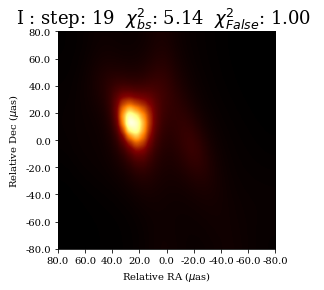

i: 20 chi2_1: 3.96 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.99 s_2: 0.00 s_3: 0.00


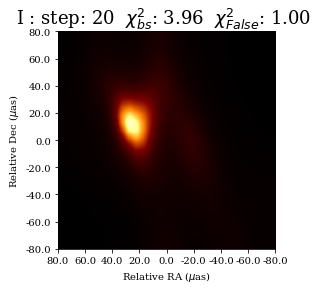

i: 21 chi2_1: 3.50 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.00 s_2: 0.00 s_3: 0.00


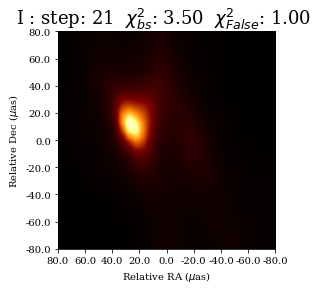

i: 22 chi2_1: 3.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.00 s_2: 0.00 s_3: 0.00


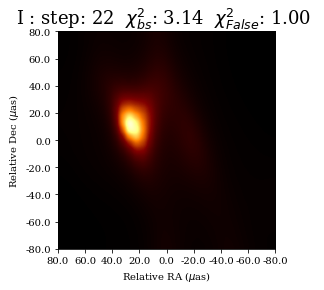

i: 23 chi2_1: 2.91 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


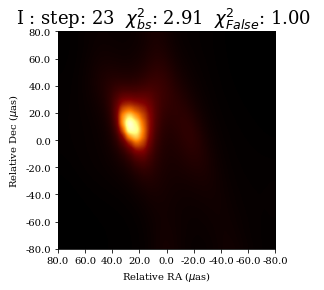

i: 24 chi2_1: 2.70 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.00 s_2: 0.00 s_3: 0.00


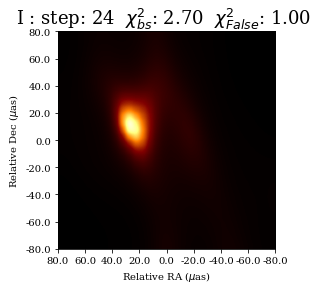

i: 25 chi2_1: 2.45 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


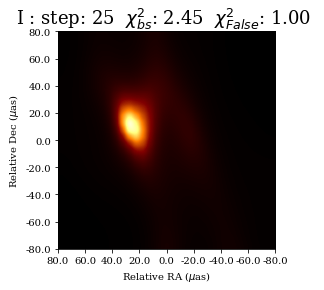

i: 26 chi2_1: 2.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.00 s_2: 0.00 s_3: 0.00


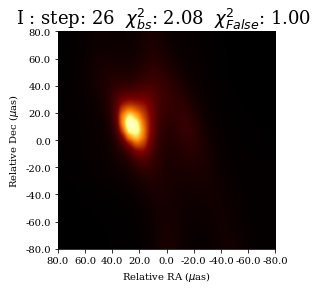

i: 27 chi2_1: 1.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


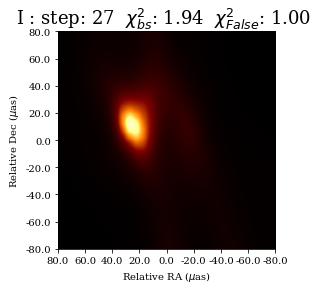

i: 28 chi2_1: 1.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


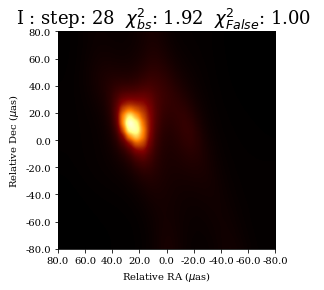

i: 29 chi2_1: 1.91 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


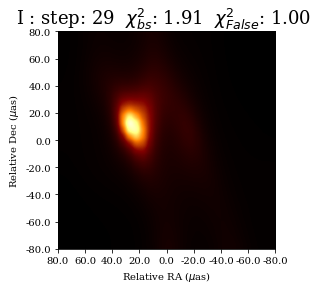

i: 30 chi2_1: 1.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


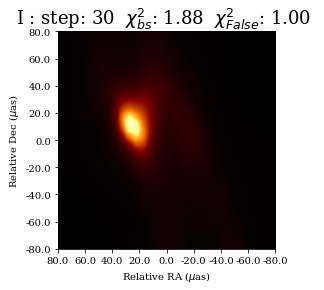

i: 31 chi2_1: 1.84 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.02 s_2: 0.00 s_3: 0.00


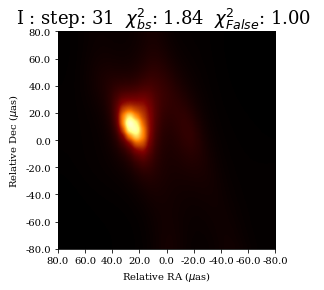

i: 32 chi2_1: 1.79 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


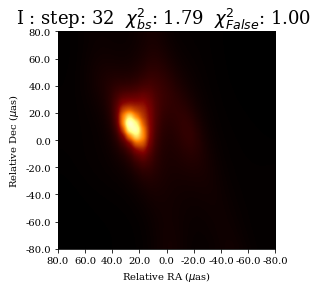

i: 33 chi2_1: 1.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


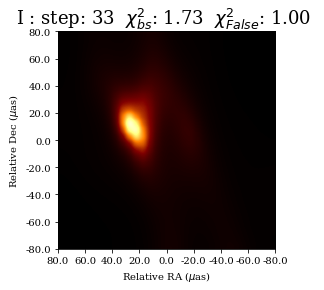

i: 34 chi2_1: 1.71 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


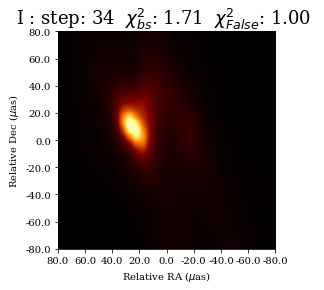

i: 35 chi2_1: 1.69 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


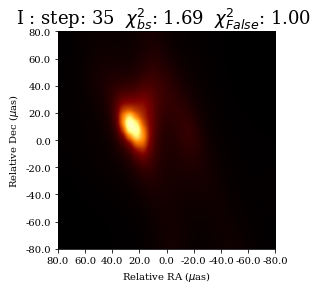

i: 36 chi2_1: 1.69 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


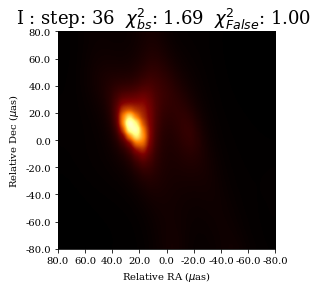

i: 37 chi2_1: 1.67 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


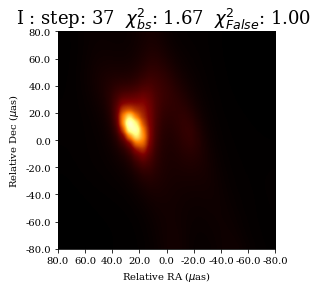

i: 38 chi2_1: 1.65 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


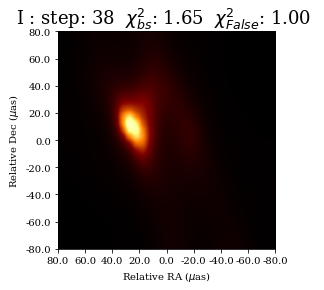

i: 39 chi2_1: 1.62 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


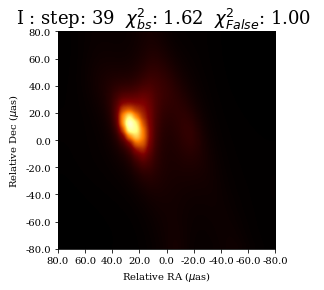

i: 40 chi2_1: 1.60 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


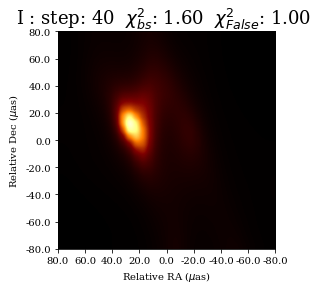

i: 41 chi2_1: 1.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.02 s_2: 0.00 s_3: 0.00


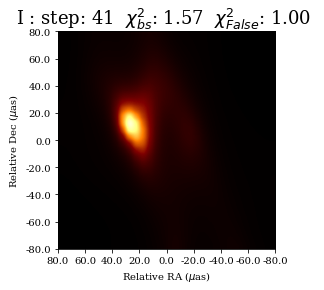

i: 42 chi2_1: 1.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.02 s_2: 0.00 s_3: 0.00


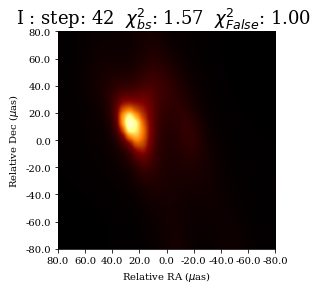

i: 43 chi2_1: 1.56 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


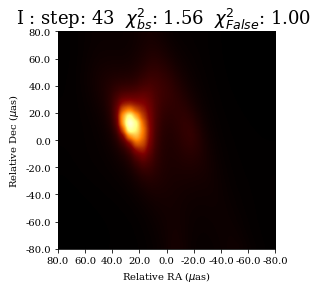

i: 44 chi2_1: 1.55 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


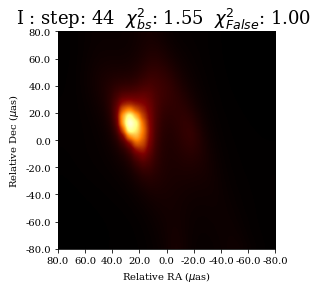

i: 45 chi2_1: 1.54 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


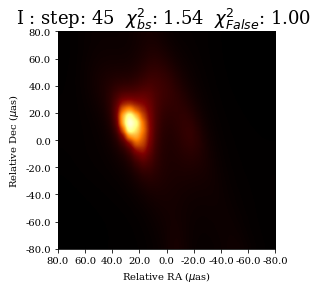

i: 46 chi2_1: 1.54 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


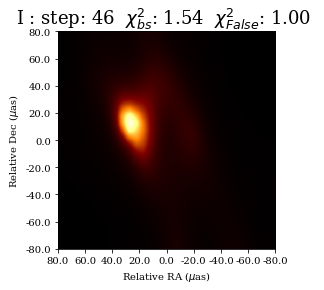

i: 47 chi2_1: 1.53 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


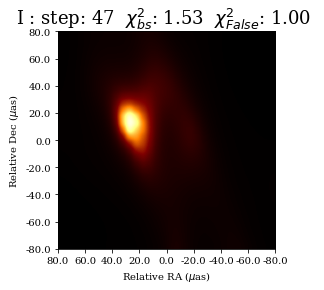

i: 48 chi2_1: 1.50 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


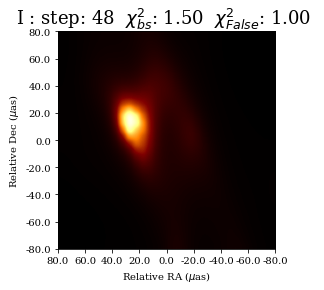

i: 49 chi2_1: 1.45 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


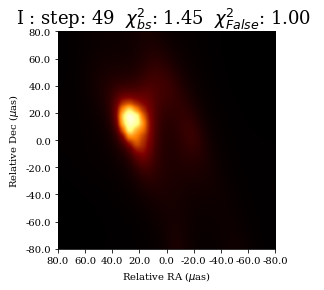

i: 50 chi2_1: 1.42 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.01 s_2: 0.00 s_3: 0.00


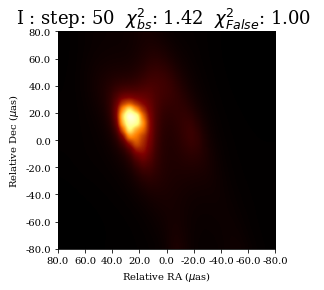

i: 51 chi2_1: 1.38 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.02 s_2: 0.00 s_3: 0.00


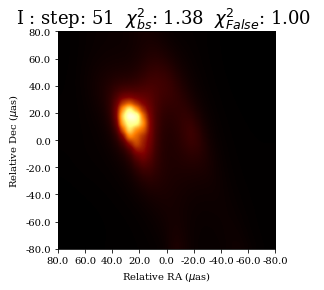

i: 52 chi2_1: 1.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


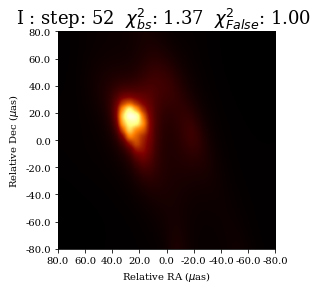

i: 53 chi2_1: 1.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.02 s_2: 0.00 s_3: 0.00


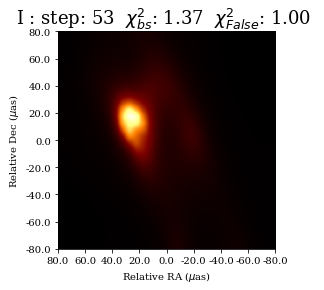

i: 54 chi2_1: 1.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


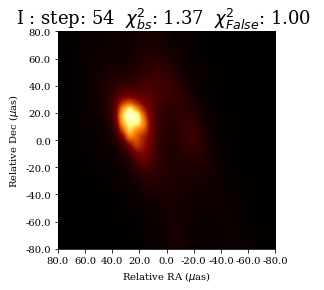

i: 55 chi2_1: 1.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


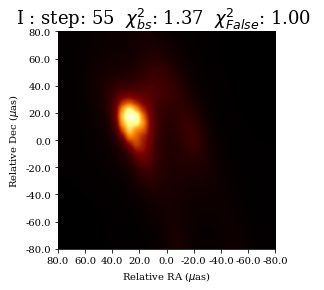

i: 56 chi2_1: 1.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


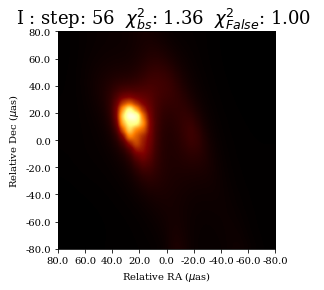

i: 57 chi2_1: 1.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.03 s_2: 0.00 s_3: 0.00


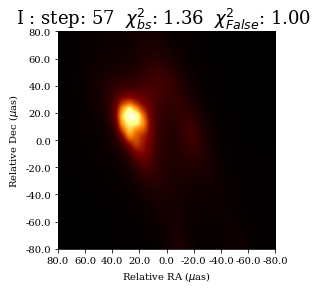

i: 58 chi2_1: 1.33 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.04 s_2: 0.00 s_3: 0.00


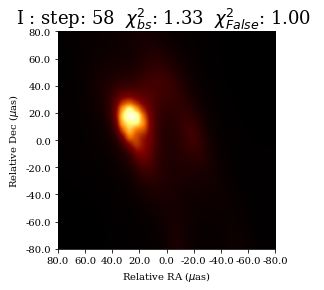

i: 59 chi2_1: 1.30 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.05 s_2: 0.00 s_3: 0.00


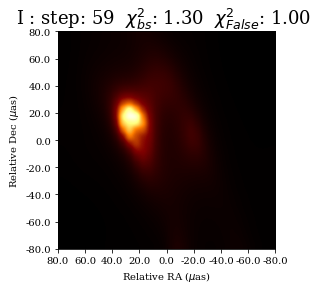

i: 60 chi2_1: 1.28 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.05 s_2: 0.00 s_3: 0.00


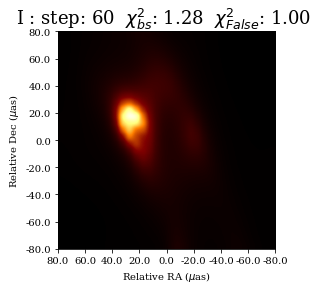

i: 61 chi2_1: 1.27 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.05 s_2: 0.00 s_3: 0.00


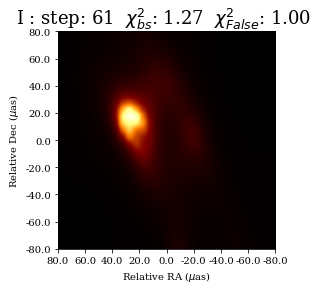

i: 62 chi2_1: 1.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.05 s_2: 0.00 s_3: 0.00


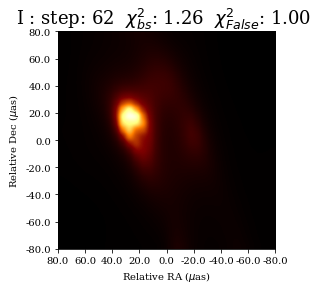

i: 63 chi2_1: 1.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.06 s_2: 0.00 s_3: 0.00


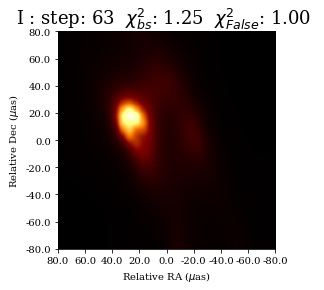

i: 64 chi2_1: 1.20 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


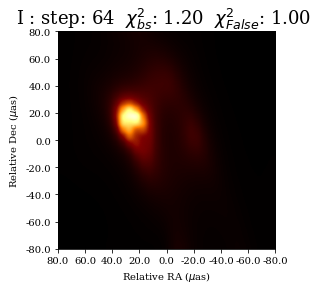

i: 65 chi2_1: 1.18 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


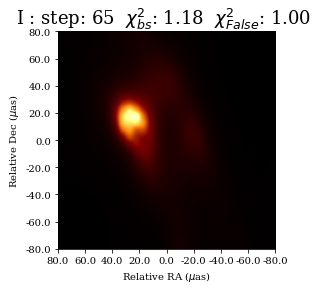

i: 66 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


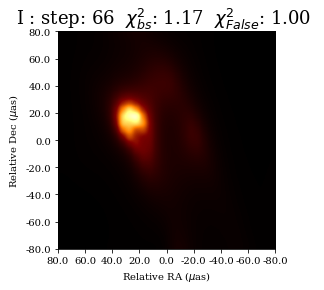

i: 67 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


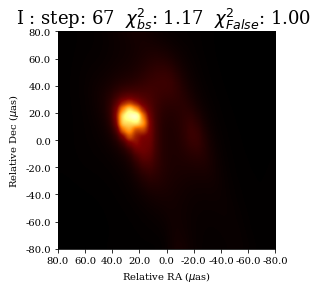

i: 68 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


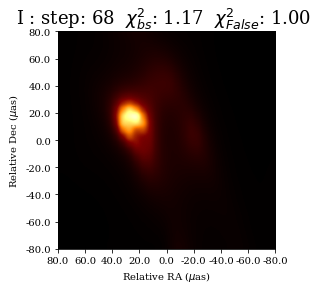

i: 69 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


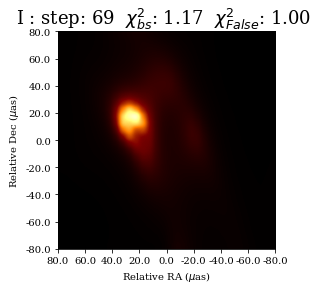

i: 70 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


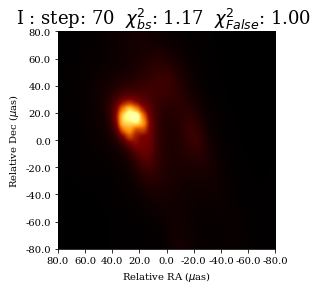

i: 71 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


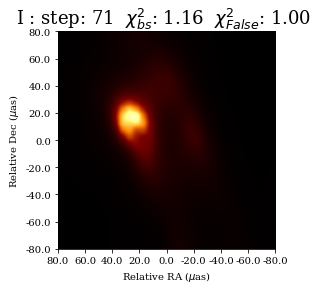

i: 72 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


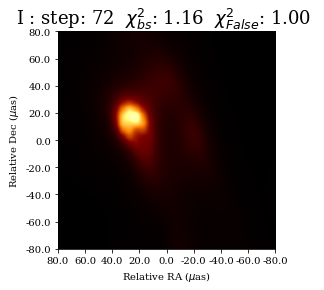

i: 73 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


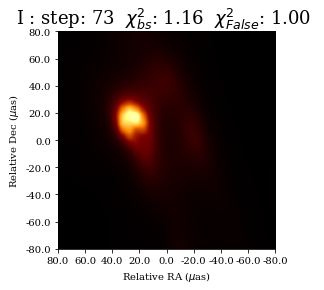

i: 74 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


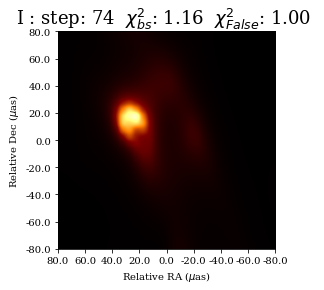

i: 75 chi2_1: 1.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


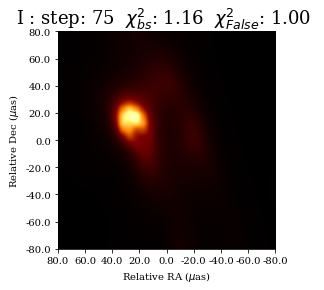

i: 76 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


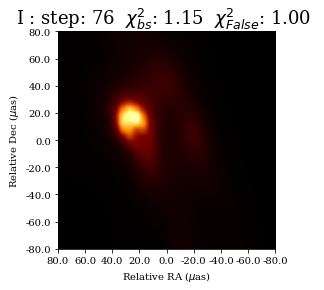

i: 77 chi2_1: 1.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


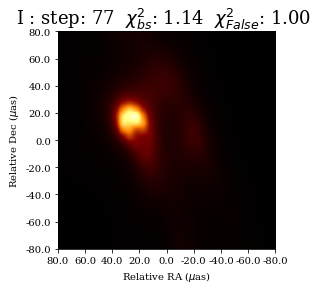

i: 78 chi2_1: 1.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.10 s_2: 0.00 s_3: 0.00


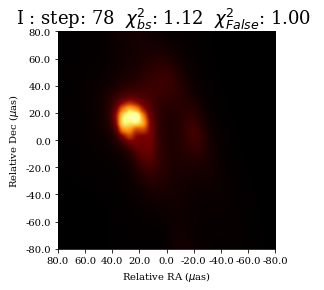

i: 79 chi2_1: 1.10 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


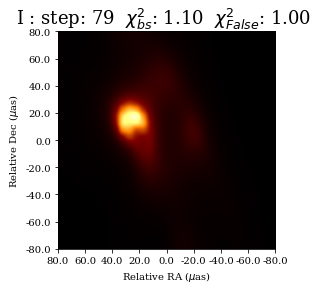

i: 80 chi2_1: 1.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


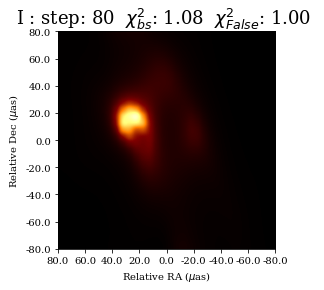

i: 81 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


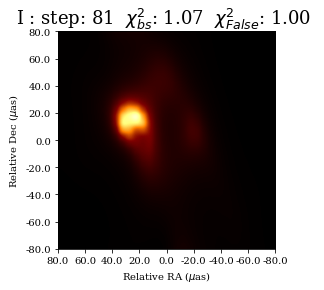

i: 82 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


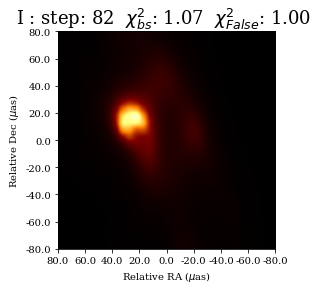

i: 83 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


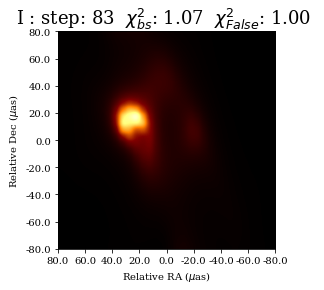

i: 84 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


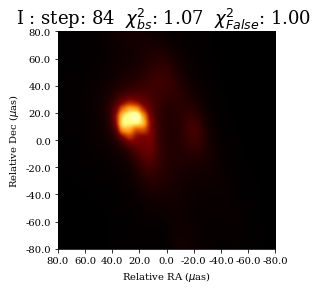

i: 85 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


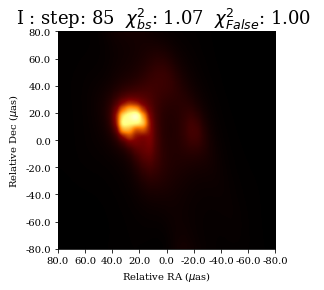

i: 86 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


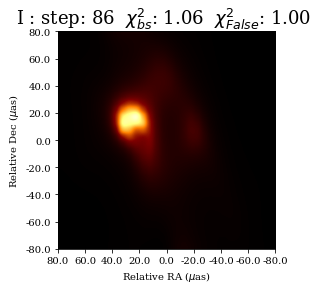

i: 87 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


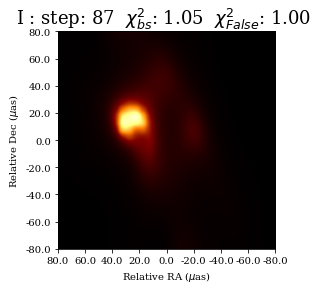

i: 88 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


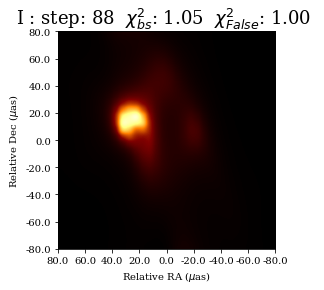

i: 89 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


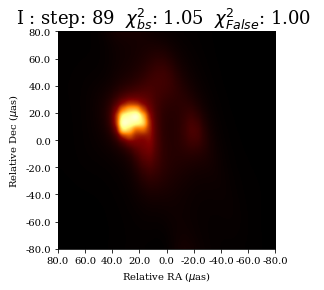

i: 90 chi2_1: 1.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.09 s_2: 0.00 s_3: 0.00


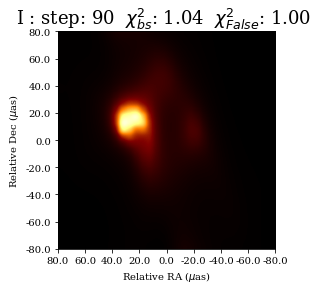

i: 91 chi2_1: 1.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


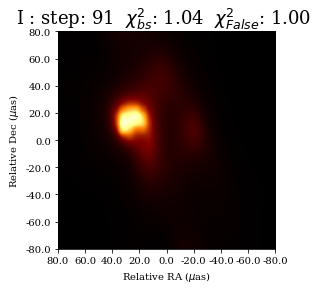

i: 92 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


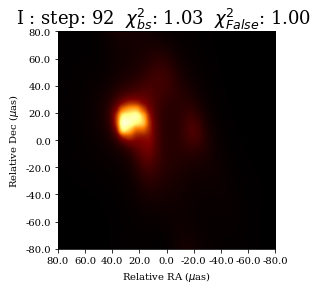

i: 93 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


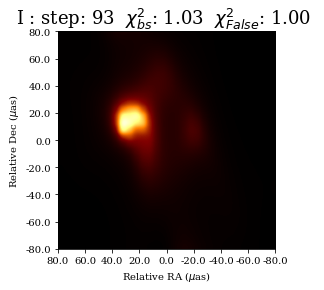

i: 94 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.08 s_2: 0.00 s_3: 0.00


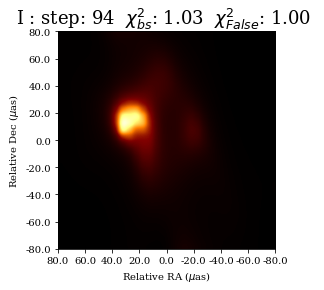

i: 95 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


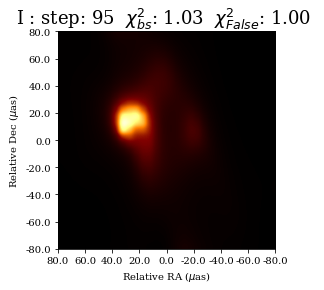

i: 96 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


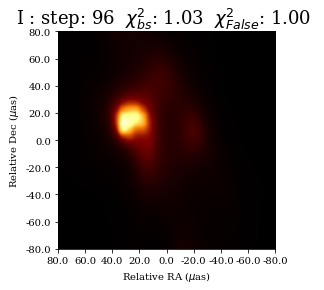

i: 97 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


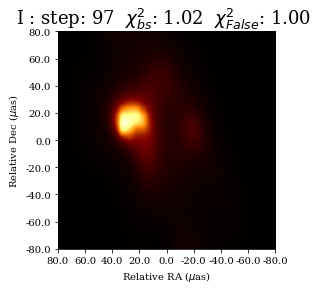

i: 98 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


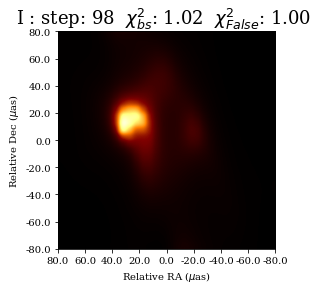

i: 99 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00


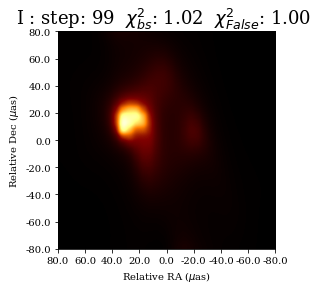

i: 100 chi2_1: 1.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 1.07 s_2: 0.00 s_3: 0.00
time: 28.334725 s
J: 1.624632
Final Chi^2_1: 1.010169 Chi^2_2: 1.000000  Chi^2_3: 1.000000
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
Generating I image...
Getting bispectra:: type vis, count min, scan 44/44 Initial S_1: 0.690150 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 180.645481 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 1797.186747
Total Data 1:  95
Total Pixel #:  1024
Clipped Pixel #:  1024



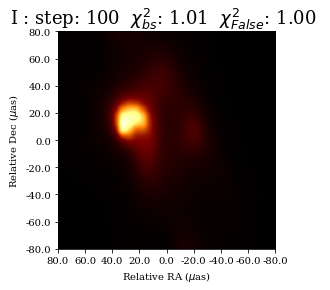

i: 0 chi2_1: 180.65 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.69 s_2: 0.00 s_3: 0.00


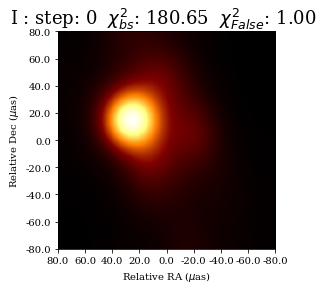

i: 1 chi2_1: 74.33 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.78 s_2: 0.00 s_3: 0.00


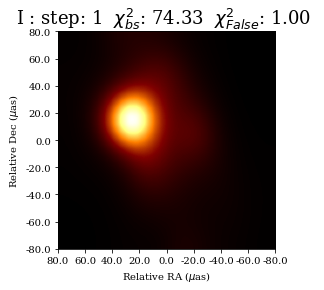

i: 2 chi2_1: 53.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.84 s_2: 0.00 s_3: 0.00


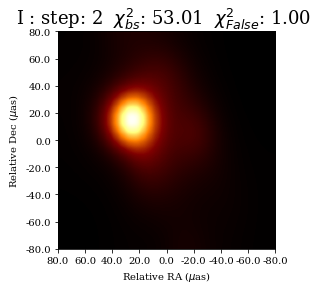

i: 3 chi2_1: 40.19 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.86 s_2: 0.00 s_3: 0.00


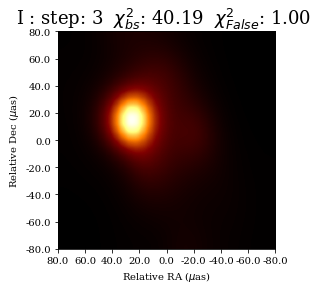

i: 4 chi2_1: 13.45 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.91 s_2: 0.00 s_3: 0.00


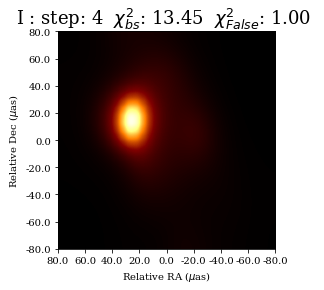

i: 5 chi2_1: 7.89 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.89 s_2: 0.00 s_3: 0.00


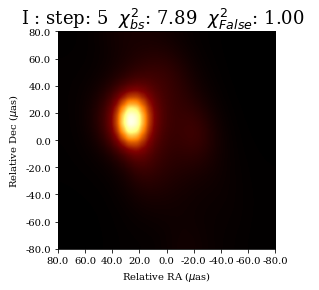

i: 6 chi2_1: 7.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.90 s_2: 0.00 s_3: 0.00


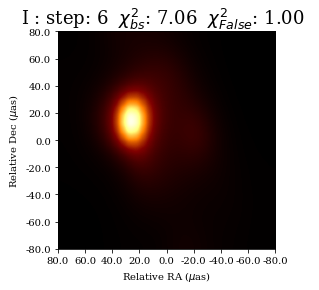

i: 7 chi2_1: 6.52 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.90 s_2: 0.00 s_3: 0.00


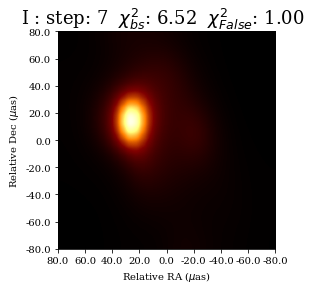

i: 8 chi2_1: 5.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.91 s_2: 0.00 s_3: 0.00


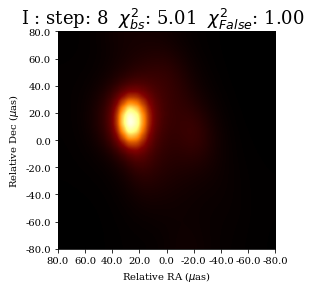

i: 9 chi2_1: 3.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


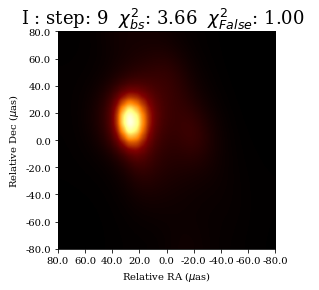

i: 10 chi2_1: 2.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


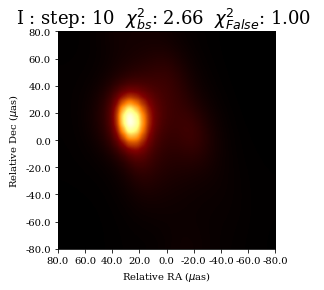

i: 11 chi2_1: 2.38 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


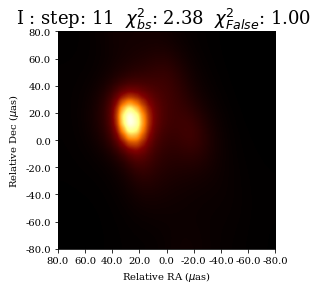

i: 12 chi2_1: 2.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


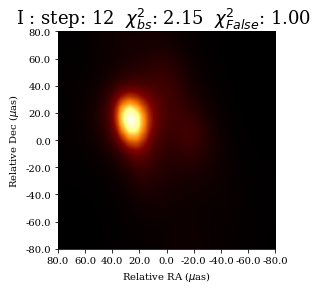

i: 13 chi2_1: 1.79 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


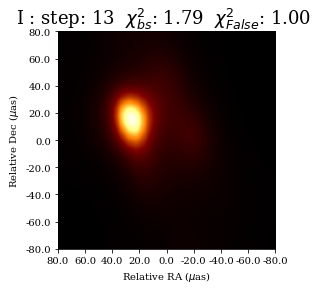

i: 14 chi2_1: 1.71 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


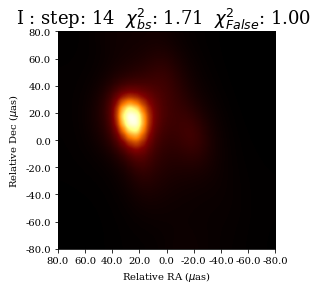

i: 15 chi2_1: 1.65 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


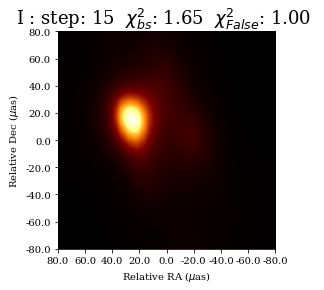

i: 16 chi2_1: 1.58 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.92 s_2: 0.00 s_3: 0.00


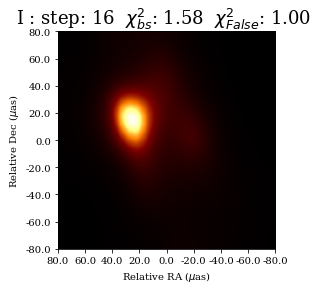

i: 17 chi2_1: 1.53 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.93 s_2: 0.00 s_3: 0.00


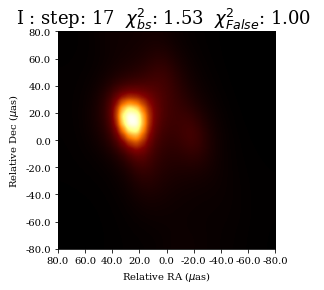

i: 18 chi2_1: 1.38 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


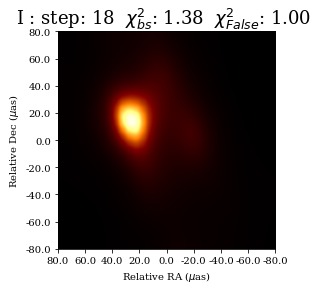

i: 19 chi2_1: 1.35 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


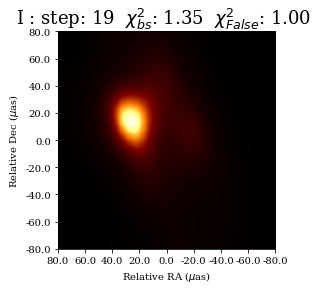

i: 20 chi2_1: 1.32 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


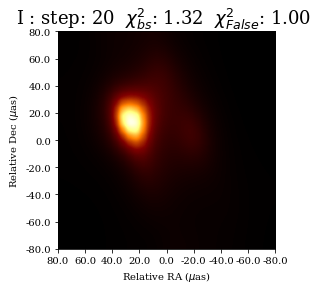

i: 21 chi2_1: 1.29 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


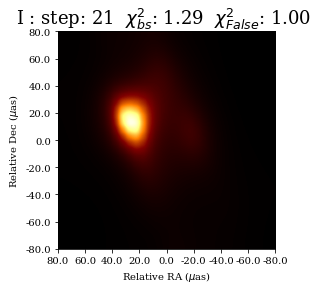

i: 22 chi2_1: 1.24 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


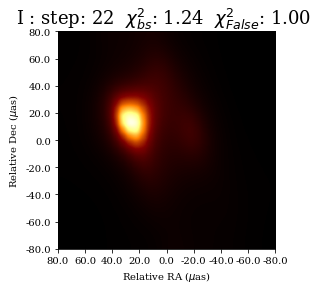

i: 23 chi2_1: 1.19 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


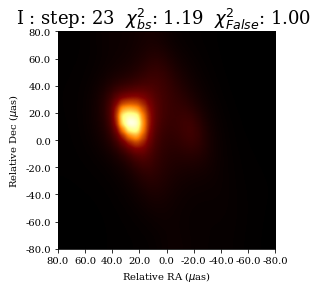

i: 24 chi2_1: 1.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


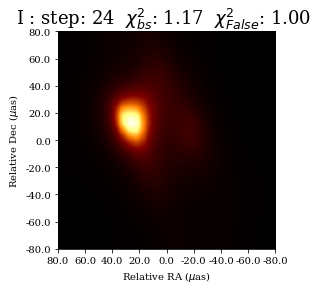

i: 25 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


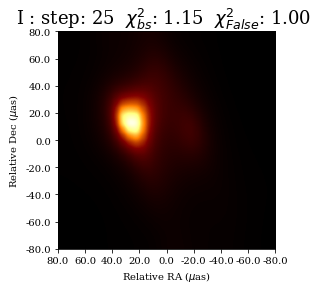

i: 26 chi2_1: 1.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


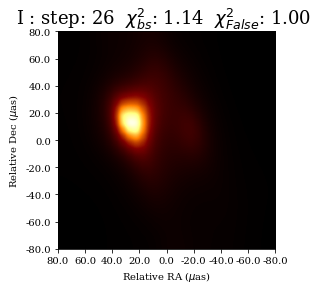

i: 27 chi2_1: 1.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


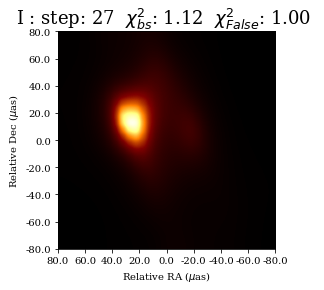

i: 28 chi2_1: 1.10 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


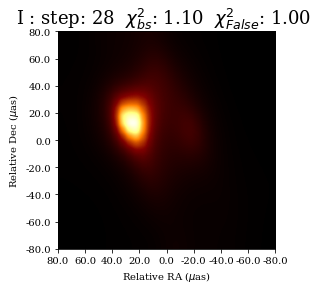

i: 29 chi2_1: 1.09 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


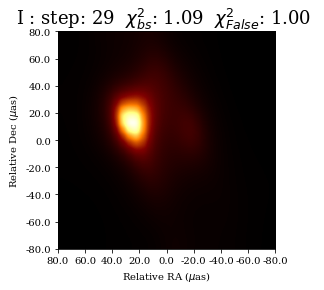

i: 30 chi2_1: 1.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


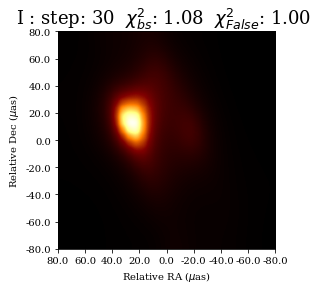

i: 31 chi2_1: 1.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


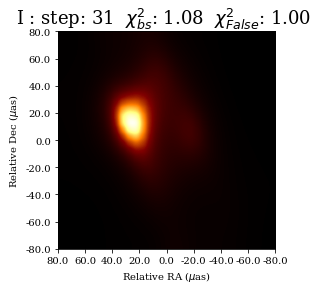

i: 32 chi2_1: 1.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


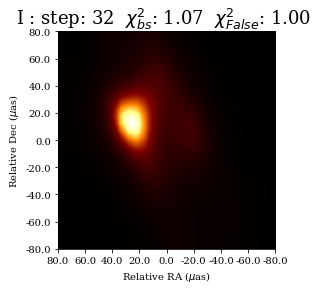

i: 33 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


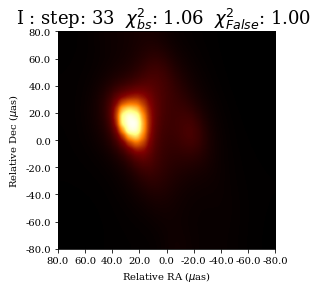

i: 34 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


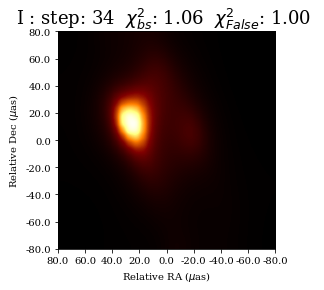

i: 35 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


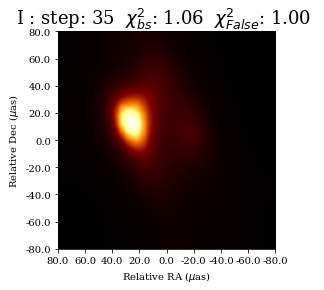

i: 36 chi2_1: 1.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


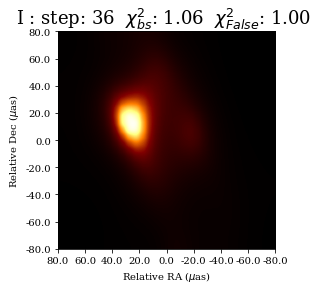

i: 37 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


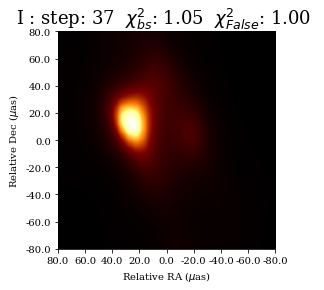

i: 38 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


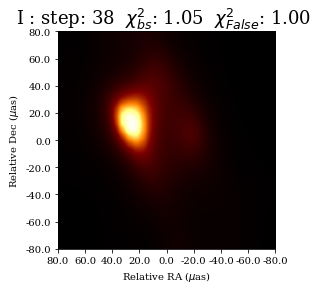

i: 39 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


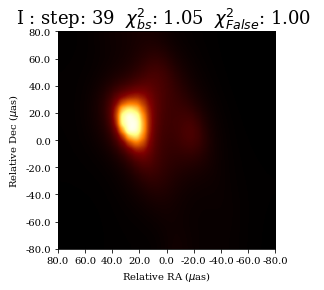

i: 40 chi2_1: 1.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


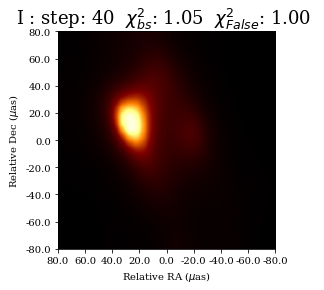

i: 41 chi2_1: 1.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


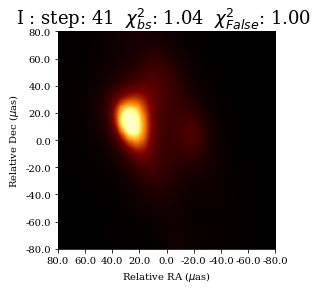

i: 42 chi2_1: 1.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


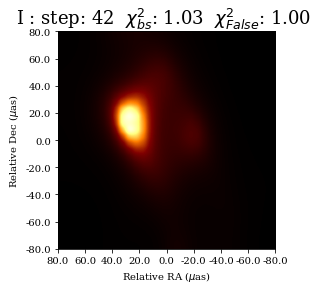

i: 43 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


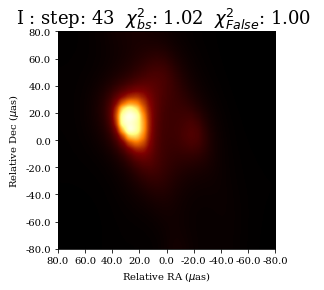

i: 44 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


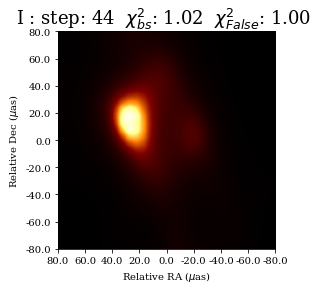

i: 45 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


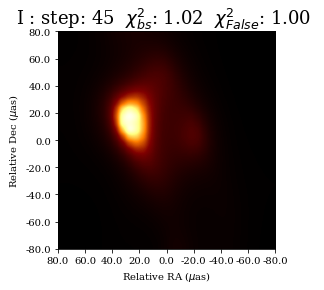

i: 46 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


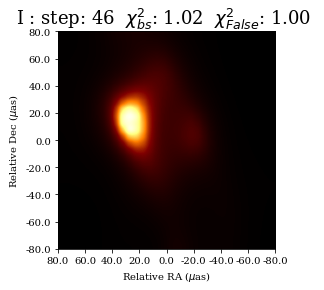

i: 47 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


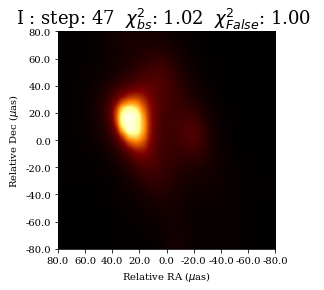

i: 48 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


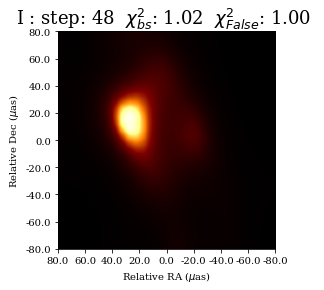

i: 49 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


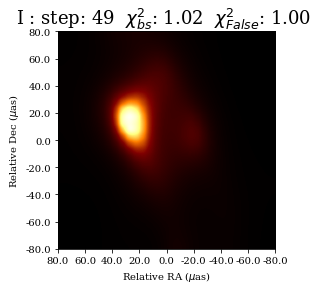

i: 50 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


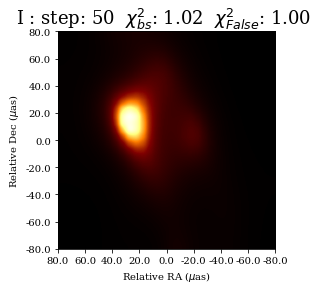

i: 51 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


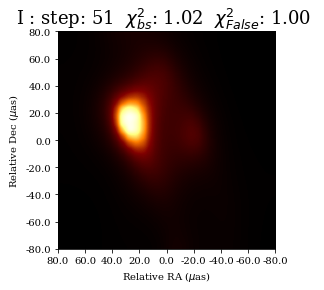

i: 52 chi2_1: 1.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.93 s_2: 0.00 s_3: 0.00


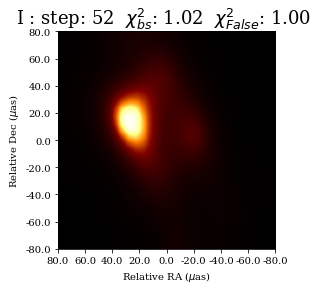

i: 53 chi2_1: 1.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.93 s_2: 0.00 s_3: 0.00


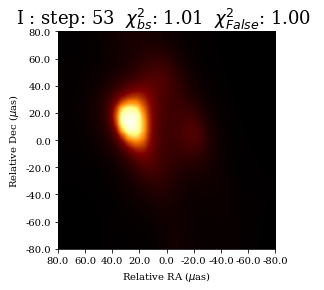

i: 54 chi2_1: 1.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


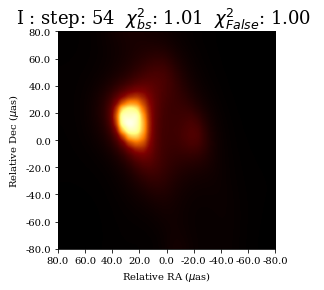

i: 55 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


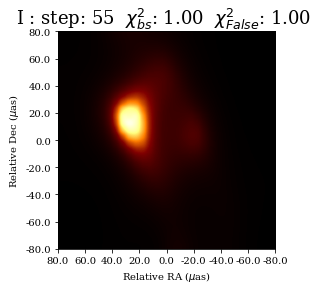

i: 56 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


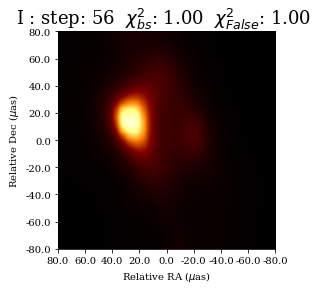

i: 57 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.94 s_2: 0.00 s_3: 0.00


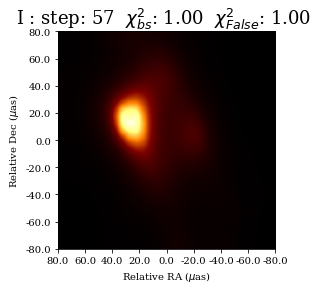

i: 58 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


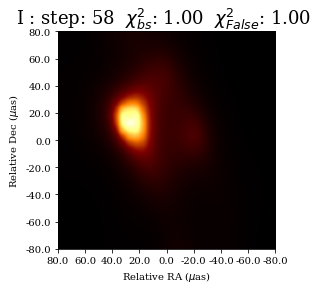

i: 59 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


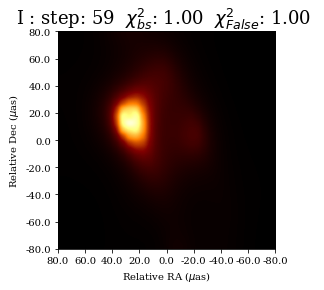

i: 60 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


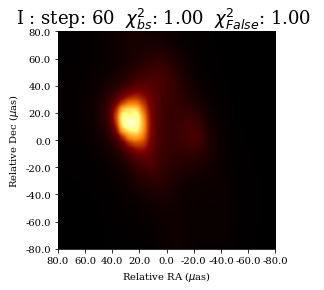

i: 61 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


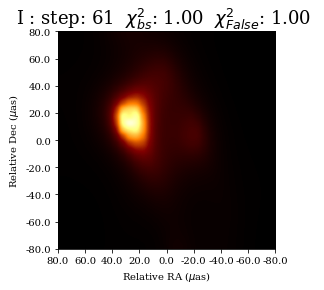

i: 62 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


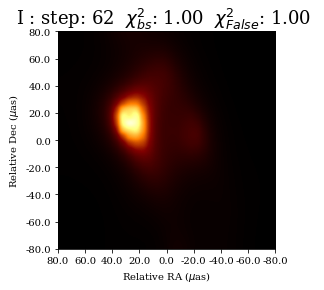

i: 63 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


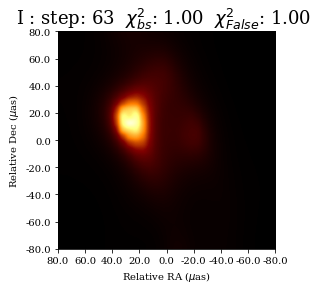

i: 64 chi2_1: 1.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


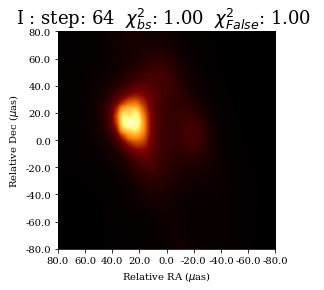

i: 65 chi2_1: 0.99 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


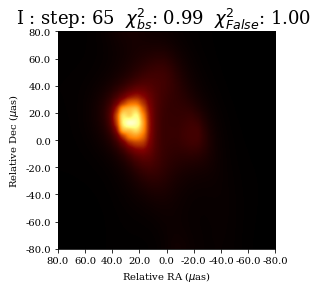

i: 66 chi2_1: 0.99 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


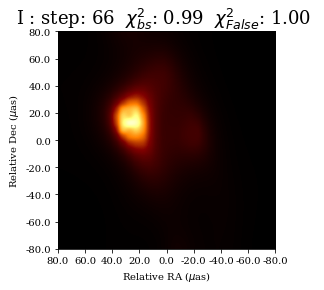

i: 67 chi2_1: 0.98 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


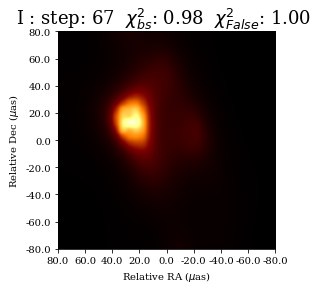

i: 68 chi2_1: 0.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


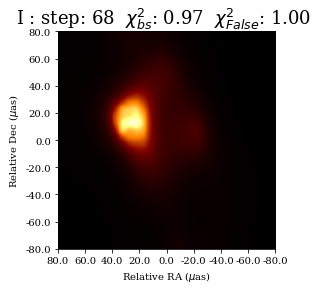

i: 69 chi2_1: 0.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


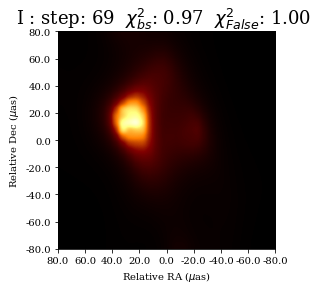

i: 70 chi2_1: 0.96 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


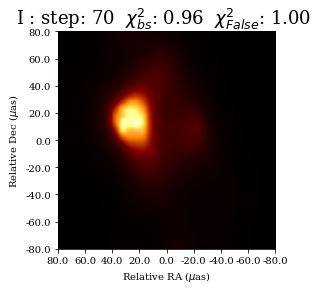

i: 71 chi2_1: 0.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


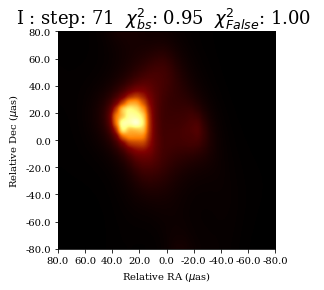

i: 72 chi2_1: 0.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


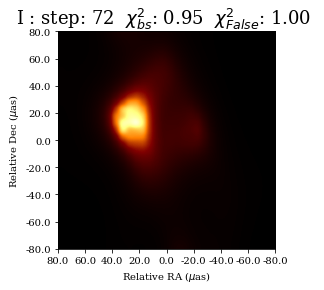

i: 73 chi2_1: 0.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


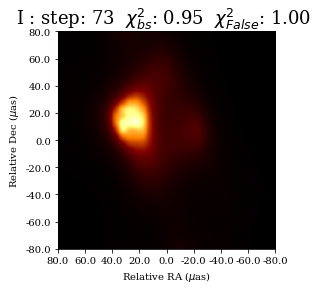

i: 74 chi2_1: 0.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


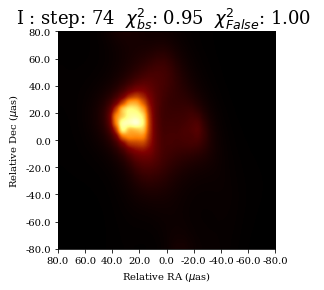

i: 75 chi2_1: 0.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


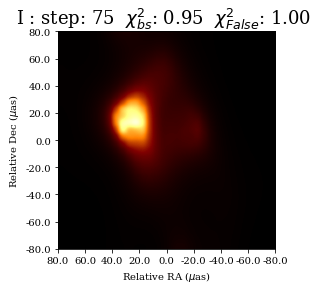

i: 76 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


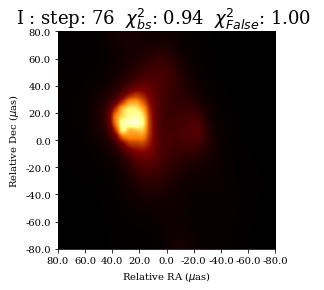

i: 77 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


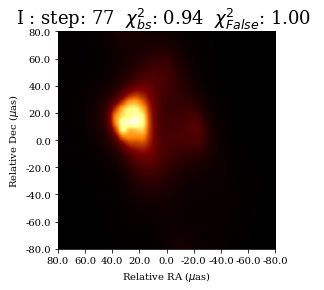

i: 78 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


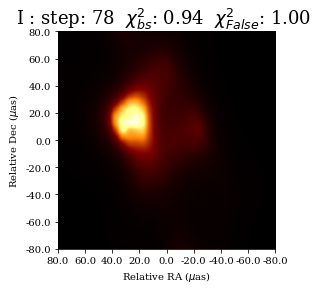

i: 79 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


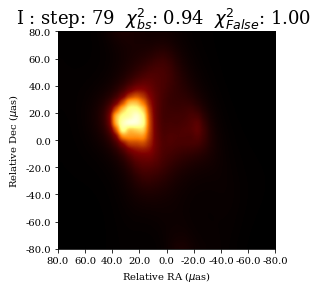

i: 80 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


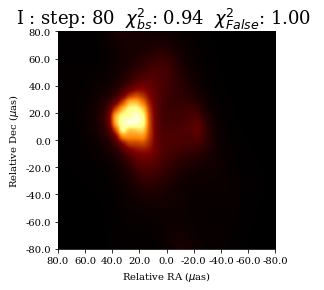

i: 81 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


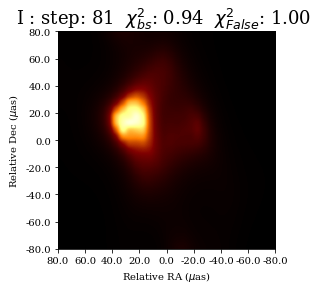

i: 82 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


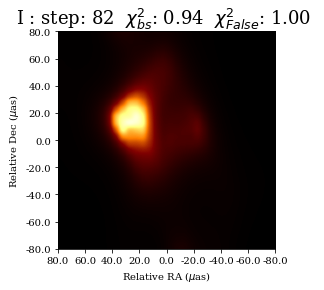

i: 83 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


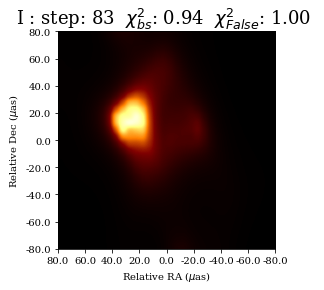

i: 84 chi2_1: 0.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


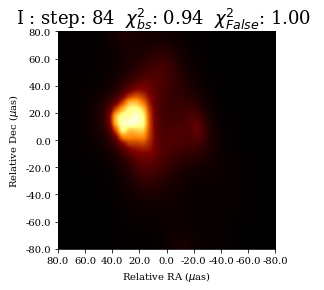

i: 85 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


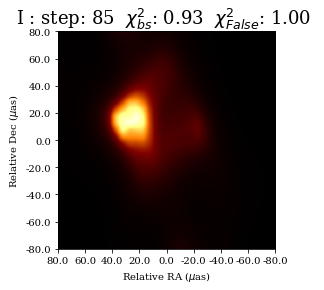

i: 86 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.99 s_2: 0.00 s_3: 0.00


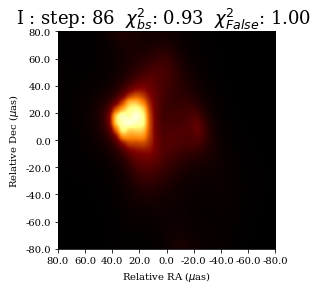

i: 87 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


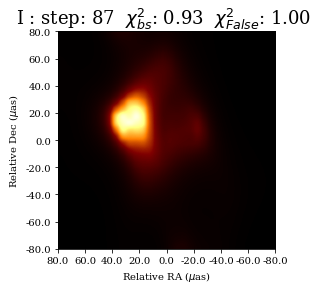

i: 88 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


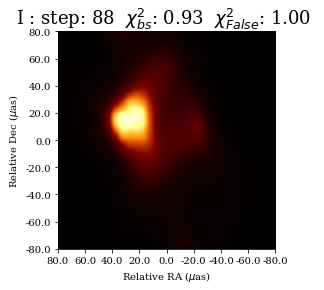

i: 89 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.98 s_2: 0.00 s_3: 0.00


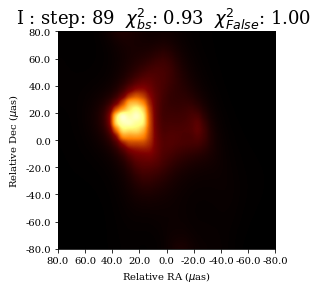

i: 90 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.97 s_2: 0.00 s_3: 0.00


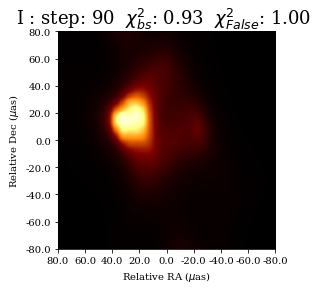

i: 91 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.96 s_2: 0.00 s_3: 0.00


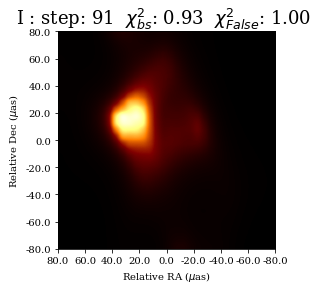

i: 92 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


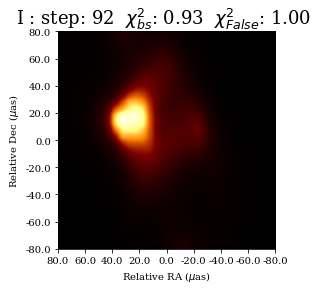

i: 93 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


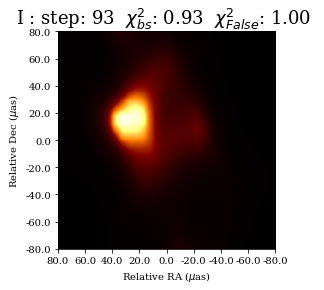

i: 94 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


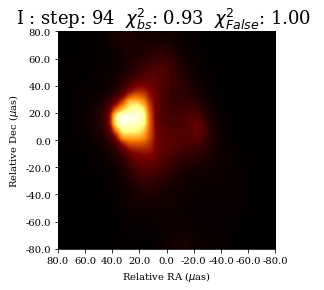

i: 95 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


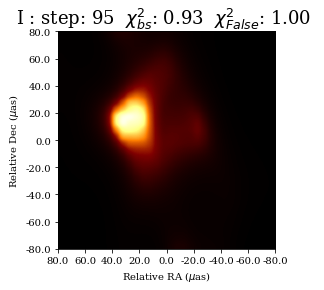

i: 96 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


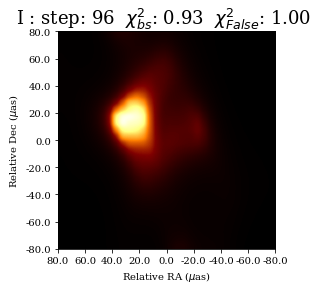

i: 97 chi2_1: 0.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


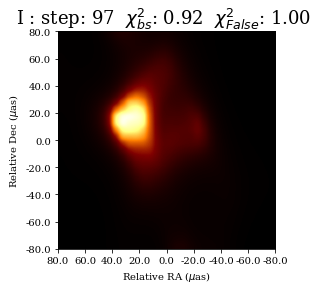

i: 98 chi2_1: 0.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


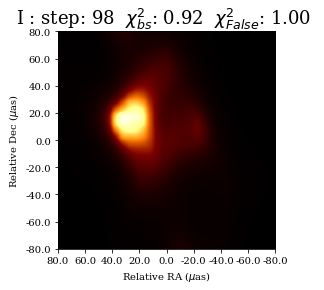

i: 99 chi2_1: 0.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00


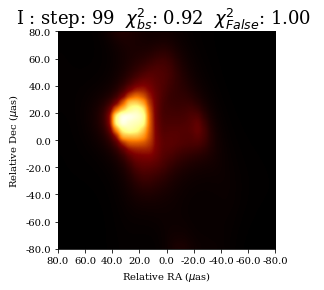

i: 100 chi2_1: 0.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.95 s_2: 0.00 s_3: 0.00
time: 27.000383 s
J: 0.171539
Final Chi^2_1: 0.921794 Chi^2_2: 1.000000  Chi^2_3: 1.000000
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
No stations specified in self cal: defaulting to calibrating all stations!
Computing the Model Visibilities with direct Fourier Transform...
Producing clean visibilities from image with direct FT . . . 
Not Using Multiprocessing
Scan 43/44 : [----------------------------- ]97%
self_cal time: 3.043786 s
Generating I image...
Initial S_1: 0.000000 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 1264.867248 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 126386.725831
Total Data 1:  205
Total Pixel #:  1024
Clipped Pixel #:  1024



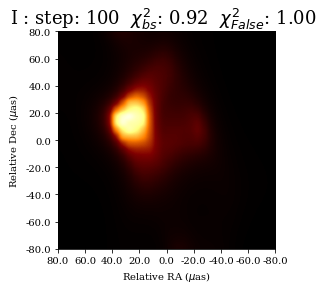

i: 0 chi2_1: 1264.87 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.00 s_2: 0.00 s_3: 0.00


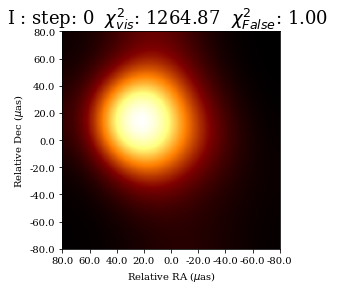

i: 1 chi2_1: 232.44 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.74 s_2: 0.00 s_3: 0.00


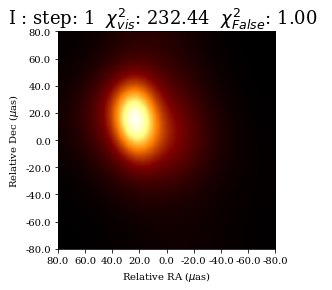

i: 2 chi2_1: 160.72 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.59 s_2: 0.00 s_3: 0.00


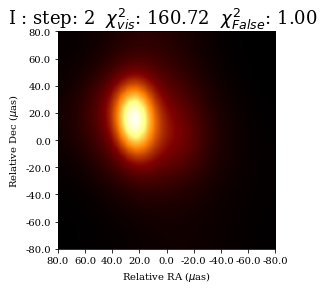

i: 3 chi2_1: 78.87 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.66 s_2: 0.00 s_3: 0.00


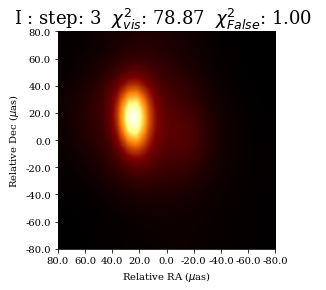

i: 4 chi2_1: 59.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.63 s_2: 0.00 s_3: 0.00


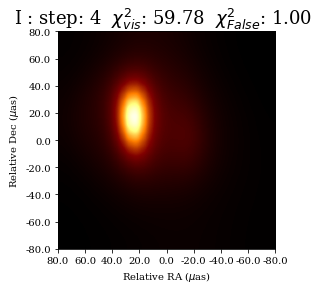

i: 5 chi2_1: 44.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.58 s_2: 0.00 s_3: 0.00


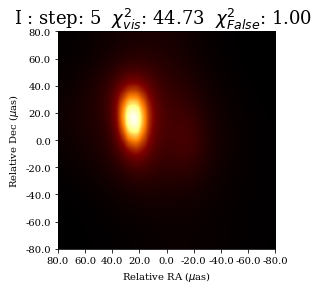

i: 6 chi2_1: 30.37 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


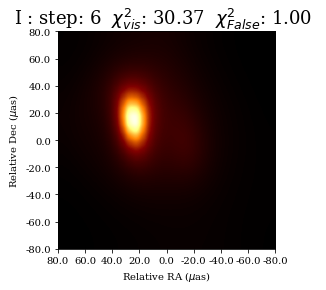

i: 7 chi2_1: 19.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


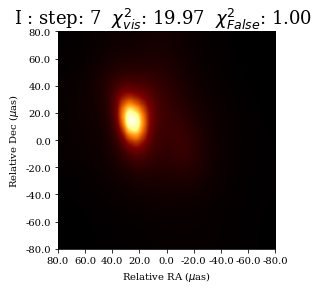

i: 8 chi2_1: 15.53 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.51 s_2: 0.00 s_3: 0.00


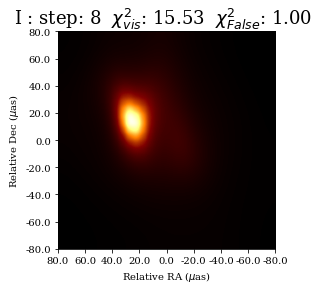

i: 9 chi2_1: 14.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


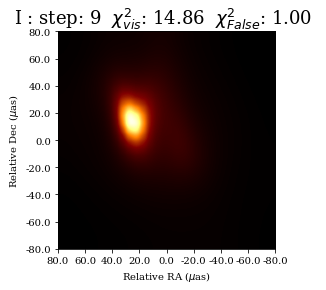

i: 10 chi2_1: 14.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


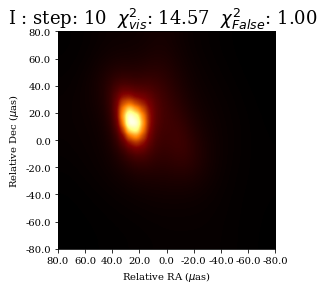

i: 11 chi2_1: 14.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


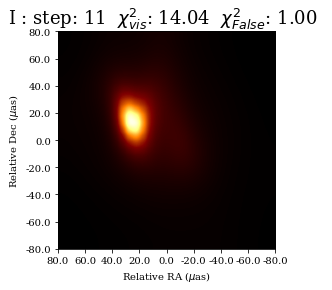

i: 12 chi2_1: 13.39 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


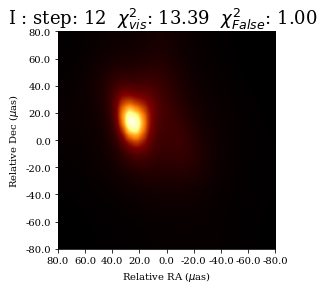

i: 13 chi2_1: 12.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.55 s_2: 0.00 s_3: 0.00


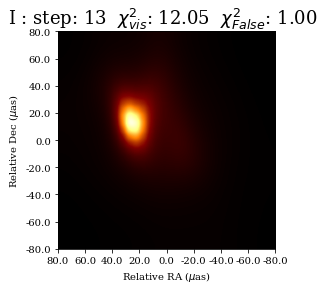

i: 14 chi2_1: 9.52 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


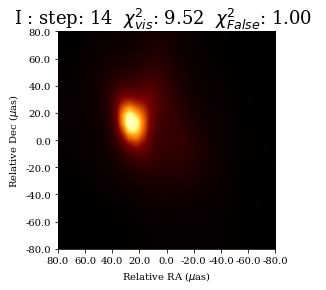

i: 15 chi2_1: 6.62 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


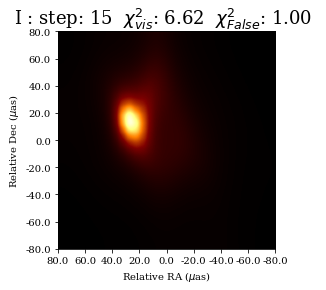

i: 16 chi2_1: 5.17 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


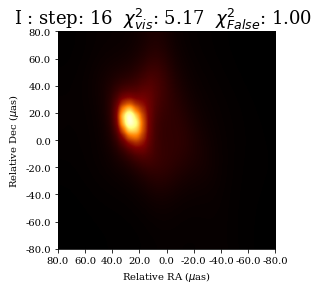

i: 17 chi2_1: 4.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


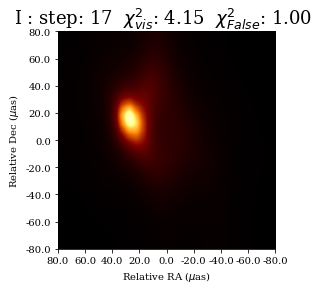

i: 18 chi2_1: 3.81 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


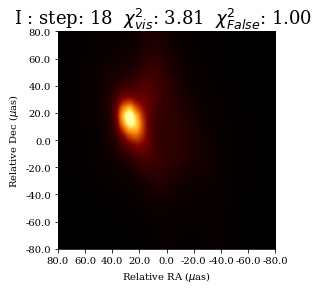

i: 19 chi2_1: 3.23 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.56 s_2: 0.00 s_3: 0.00


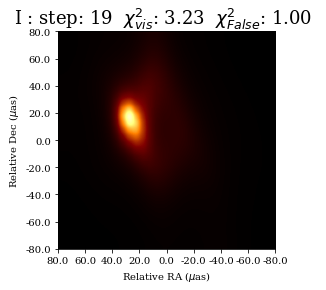

i: 20 chi2_1: 2.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.55 s_2: 0.00 s_3: 0.00


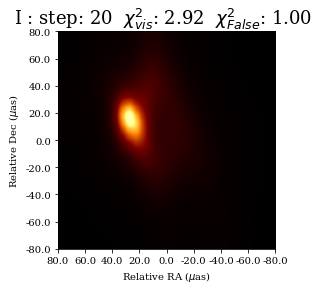

i: 21 chi2_1: 2.58 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.55 s_2: 0.00 s_3: 0.00


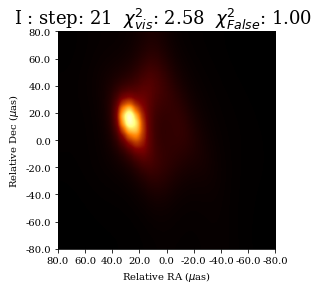

i: 22 chi2_1: 2.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


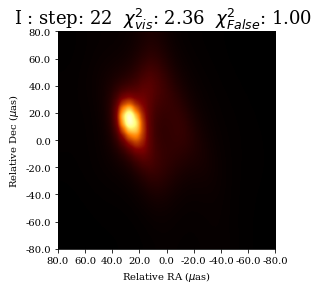

i: 23 chi2_1: 2.19 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


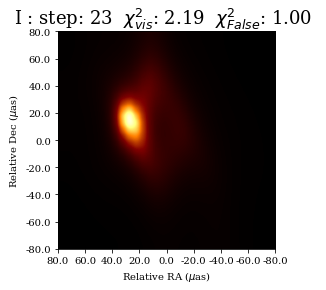

i: 24 chi2_1: 2.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


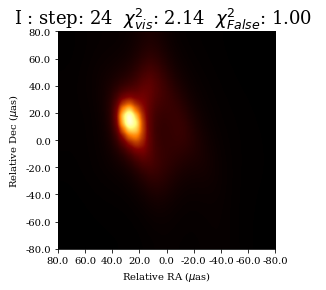

i: 25 chi2_1: 2.09 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


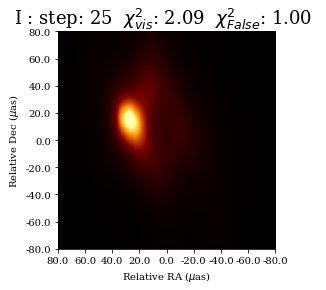

i: 26 chi2_1: 2.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


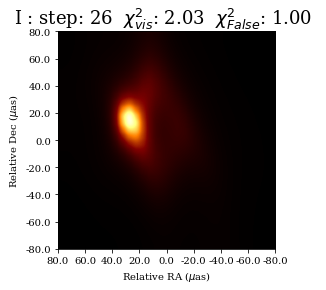

i: 27 chi2_1: 1.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


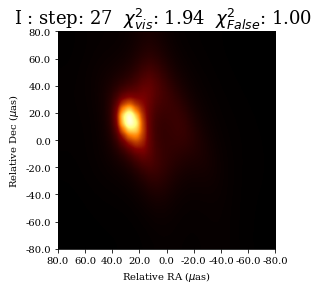

i: 28 chi2_1: 1.79 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


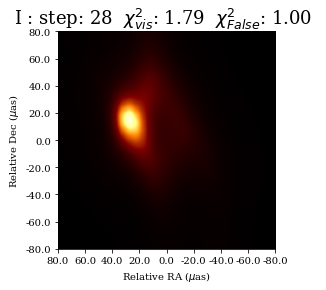

i: 29 chi2_1: 1.54 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


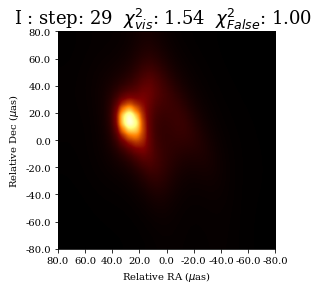

i: 30 chi2_1: 1.39 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


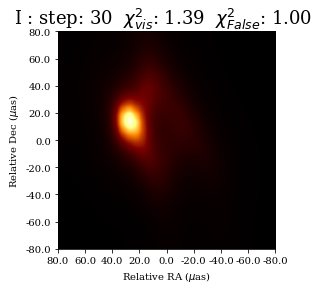

i: 31 chi2_1: 1.33 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


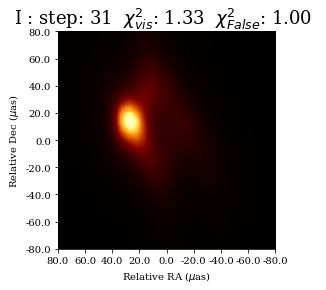

i: 32 chi2_1: 1.31 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


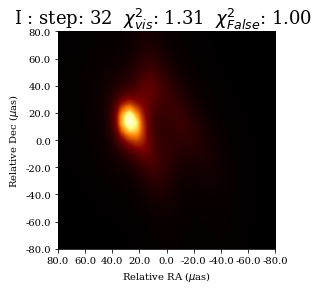

i: 33 chi2_1: 1.27 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


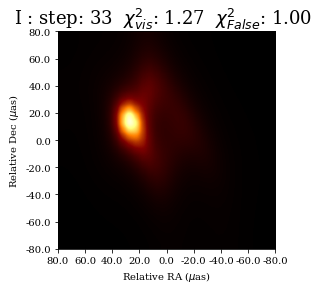

i: 34 chi2_1: 1.21 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.54 s_2: 0.00 s_3: 0.00


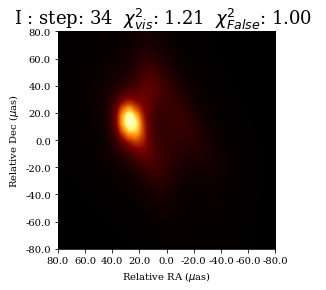

i: 35 chi2_1: 1.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


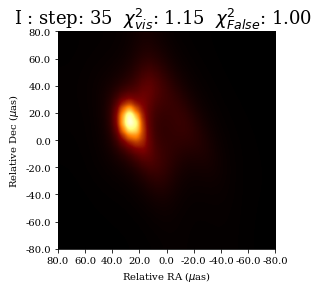

i: 36 chi2_1: 1.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.53 s_2: 0.00 s_3: 0.00


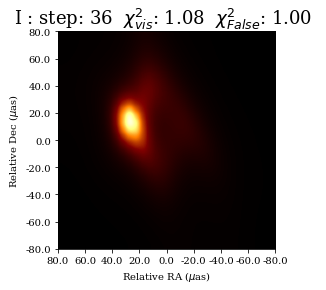

i: 37 chi2_1: 0.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


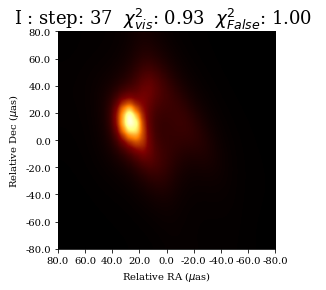

i: 38 chi2_1: 0.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.51 s_2: 0.00 s_3: 0.00


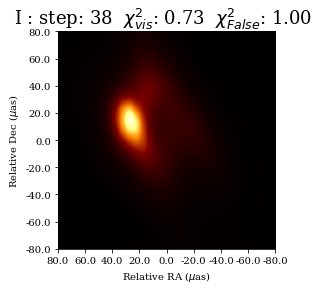

i: 39 chi2_1: 0.67 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.51 s_2: 0.00 s_3: 0.00


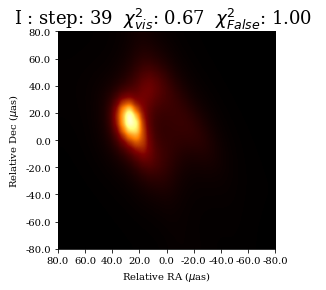

i: 40 chi2_1: 0.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.51 s_2: 0.00 s_3: 0.00


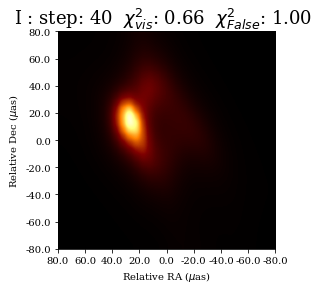

i: 41 chi2_1: 0.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.51 s_2: 0.00 s_3: 0.00


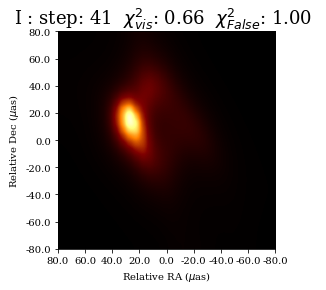

i: 42 chi2_1: 0.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


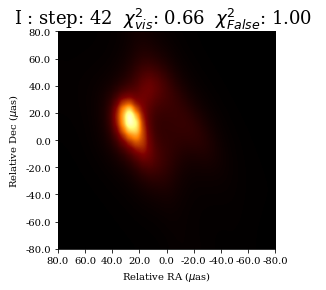

i: 43 chi2_1: 0.64 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


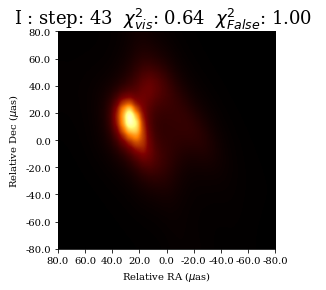

i: 44 chi2_1: 0.62 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


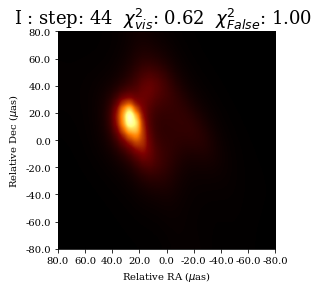

i: 45 chi2_1: 0.59 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


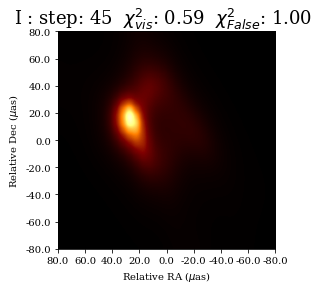

i: 46 chi2_1: 0.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


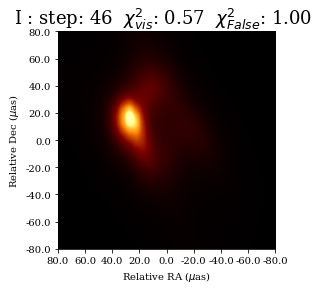

i: 47 chi2_1: 0.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


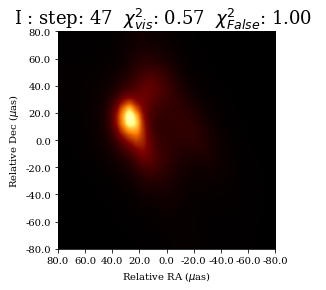

i: 48 chi2_1: 0.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


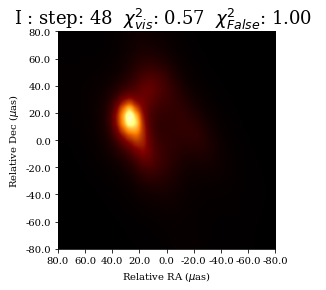

i: 49 chi2_1: 0.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00


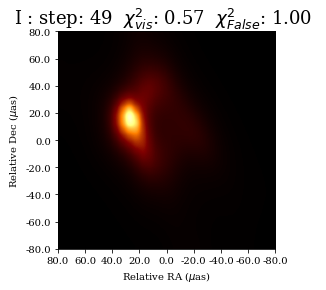

i: 50 chi2_1: 0.56 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.52 s_2: 0.00 s_3: 0.00
time: 11.944216 s
J: -43.463474
Final Chi^2_1: 0.560134 Chi^2_2: 1.000000  Chi^2_3: 1.000000
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'


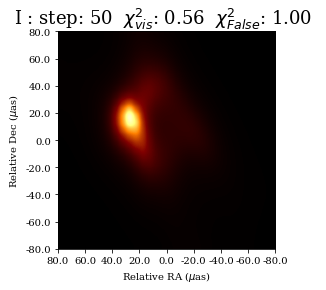

In [8]:
# Export the visibility data to uvfits/text
#obs.save_txt('obs.txt') # exports a text file with the visibilities
#obs.save_uvfits('obs.uvp') # exports a UVFITS file modeled on template.UVP

# Generate an image prior
npix = 32
fov = 1*im.fovx()
zbl = im.total_flux() # total flux
prior_fwhm = 200*eh.RADPERUAS # Gaussian size in microarcssec
emptyprior = eh.image.make_square(obs, npix, fov)
flatprior = emptyprior.add_flat(zbl)
gaussprior = emptyprior.add_gauss(zbl, (prior_fwhm, prior_fwhm, 0, 0, 0))

# Image total flux with bispectrum
flux = zbl
out  = eh.imager_func(obs, gaussprior, gaussprior, flux,
                      d1='bs', s1='simple',
                      alpha_s1=1, alpha_d1=100,
                      alpha_flux=100, alpha_cm=50,
                      maxit=100, ttype='nfft')

# Blur the image with a circular beam and image again to help convergance
out = out.blur_circ(res)
out = eh.imager_func(obs, out, out, flux,
                d1='bs', s1='tv',
                alpha_s1=1, alpha_d1=50,
                alpha_flux=100, alpha_cm=50,
                maxit=100,ttype='nfft')

out = out.blur_circ(res/2.0)
out = eh.imager_func(obs, out, out, flux,
                d1='bs', s1='tv',
                alpha_s1=1, alpha_d1=10,
                alpha_flux=100, alpha_cm=50,
                maxit=100,ttype='nfft')


# Self - calibrate and image with vis amplitudes
obs_sc = sc.self_cal(obs, out)

out_sc = out.blur_circ(res)
out_sc = eh.imager_func(obs_sc, out_sc, out_sc, flux,
                   d1='vis', s1='simple',
                   alpha_s1=1, alpha_d1=100,
                   alpha_flux=100, alpha_cm=50,
                   maxit=50,ttype='nfft')

Producing clean visibilities from image with nfft FT . . . 
Adding gain + phase errors to data and applying a priori calibration . . . 


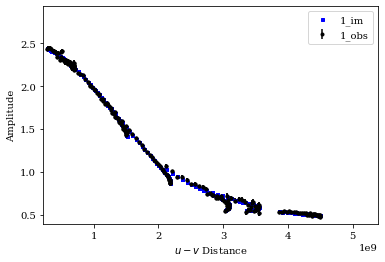

In [9]:
# Compare the visibility amplitudes to the data
out = out_sc
eh.comp_plots.plotall_obs_im_compare(obs, out,'uvdist','amp', clist=['b','m'],conj=True)

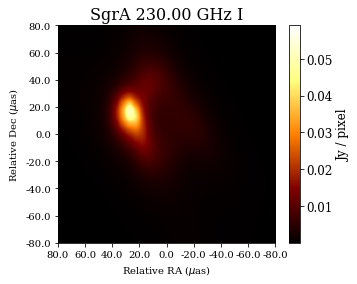

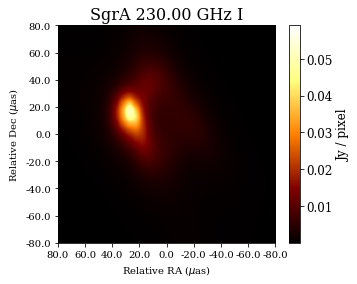

In [10]:
# Blur the final image with 1/2 the clean beam
outblur = out.blur_gauss(beamparams, 0.5)
out.display()

In [ ]:
# Save the images
outname = "test"
out.save_txt(outname + '.txt')
out.save_fits(outname + '.fits')
outblur.save_txt(outname + '_blur.txt')
outblur.save_fits(outname + '_blur.fits')